<h1 style="font-size:60px; color:DarkBlue;"><i><center>Prevendo Customer Churn em Operadoras de Telecom</center></i></h1>


<font face="Arial" size="3px" color="DarkBlue"><b>Autor:</b> Paulo Henrique Piai</font><br><br>
<font face="Arial" size="3px" color="DarkBlue"><b>Data:</b> 07/05/2021</font>

In [1]:
from IPython.display import Image
Image(url = 'imagens/churn.jpg')

# <font color='DarkBlue'>1 - Definindo o problema de negócio:</font>
### <font color='DarkBlue'>Significado de Customer Churn:
<font color='DarkBlue'>Customer Churn (ou Rotatividade de Clientes, em uma tradução livre) refere- se a uma decisão tomada pelo cliente sobre o término do relacionamento comercial. Refere-se também à perda de clientes.
    
### <font color='DarkBlue'>A importância da fidelidade do cliente para o negócio:
A fidelidade do cliente e a rotatividade de clientes sempre somam 100%. Se uma empresa tem uma taxa de fidelidade de 60%, então a taxa de perda de clientes é de 40%. De acordo com a regra de lucratividade do cliente 80/20, 20% dos clientes estão gerando 80% da receita.
    
### <font color='DarkBlue'>Objetivo:
Utilizando <b>linguagem Python</b>, prever os usuários que provavelmente abandonarão o relacionamento comercial e os fatores que afetam as decisões do cliente.

# <font color='DarkBlue'>2 - Coleta dos dados:</font>

## <font color='DarkBlue'>2.1 - Importação da bibliotecas:</font>

In [3]:
# Carregando pacotes:

# Importando biblioteca, para ocultar Warnings.
import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)
warnings.simplefilter(action = 'ignore', category = UserWarning)
warnings.filterwarnings(action = 'ignore', category=RuntimeWarning)
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

# Importando bibliotecas, para a manipulação e exploração dos conjuntos de dados.
import pandas as pd
import numpy as np
from sklearn.preprocessing import OrdinalEncoder

# Importando bibliotecas, para a plotagem de gráficos com o Seaborn e Matplotlib.
import matplotlib.pyplot as plt
import seaborn as sns

# Importando bibliotecas, para a plotagem de gráficos interativos com o plotly.
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff

# Importando classes para calcular algumas estatísticas.
from scipy.stats import kurtosis, skew

# Importando classes e bibliotecas, para a etapa de pré-processamento dos dados.
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler, Normalizer, StandardScaler

# Importando biliotecas, para a etapa de Feature Selection.
from sklearn.feature_selection import SelectKBest, chi2, RFE
from sklearn.decomposition import PCA

# Importando bibliotecas, para a etapa de modelagem preditiva.
import xgboost as xgb
from sklearn import model_selection
from sklearn import tree
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier

# Importando classes, para fazer a busca dos melhores parâmetros, a serem utilizados em cada um dos modelos treinados.
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Importando classes, para calcular as métricas de avaliação dos modelos preditivos.
from sklearn.metrics import accuracy_score, balanced_accuracy_score, average_precision_score, precision_score
from sklearn.metrics import recall_score, f1_score, roc_auc_score, cohen_kappa_score

# Importando classe, para carregar e salvar modelos preditivos em arquivos externos.
import pickle

## <font color='DarkBlue'>2.2 - Carregando os dados:</font>

In [4]:
# Carregando os dados de treino:
arquivo = 'projeto2_telecom_treino.csv'
dadosTreino = pd.read_csv(arquivo)

In [5]:
# Carregando os dados de teste:
arquivo = 'projeto2_telecom_teste.csv'
dadosTeste = pd.read_csv(arquivo)

In [6]:
# Exibindo as primeiras linhas do Dataset de treino:
dadosTreino.head(5)

,Unnamed: 0,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,1,KS,128,area_code_415,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
1,2,OH,107,area_code_415,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
2,3,NJ,137,area_code_415,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
3,4,OH,84,area_code_408,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
4,5,OK,75,area_code_415,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [7]:
# Exibindo as primeiras linhas do Dataset de teste:
dadosTeste.head(5)

,Unnamed: 0,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,1,HI,101,area_code_510,no,no,0,70.9,123,12.05,...,73,18.01,236.0,73,10.62,10.6,3,2.86,3,no
1,2,MT,137,area_code_510,no,no,0,223.6,86,38.01,...,139,20.81,94.2,81,4.24,9.5,7,2.57,0,no
2,3,OH,103,area_code_408,no,yes,29,294.7,95,50.10,...,105,20.17,300.3,127,13.51,13.7,6,3.70,1,no
3,4,NM,99,area_code_415,no,no,0,216.8,123,36.86,...,88,10.74,220.6,82,9.93,15.7,2,4.24,1,no
4,5,SC,108,area_code_415,no,no,0,197.4,78,33.56,...,101,10.54,204.5,107,9.20,7.7,4,2.08,2,no


 # <font color='DarkBlue'>3 - Visualização dos dados:</font>

## <font color='DarkBlue'>3.1 - Dados de treino:</font>

In [8]:
# Visualizando a dimensão do dataset de treino:
print(dadosTreino.shape)

(3333, 21)


<font color='DarkBlue'>Existe <b>3333 observações </b> (linhas) e <b>21 variáveis </b>(colunas) dentro do dataset de treino.

In [9]:
# visualizando o formato do dataset
type(dadosTreino)

pandas.core.frame.DataFrame

In [10]:
# Tipo de dados de cada atributo
dadosTreino.dtypes

Unnamed: 0                         int64
state                             object
account_length                     int64
area_code                         object
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
dtype: object

<font color='DarkBlue'>O tipo dos dados é muito importante. Pode ser necessário converter strings, ou colunas com números inteiros podem representar variáveis categóricas ou valores ordinários.

In [11]:
# Verificando o número de IDs duplicados.
dadosTreino.duplicated().sum()

0

<font color='DarkBlue'> Não há registros duplicados no dataset.

In [12]:
# Verificando se há valores nulos:
dadosTreino.isnull().sum()

Unnamed: 0                       0
state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

#### <font color='DarkBlue'> Não há valores nulos.
<font color='DarkBlue'>Não podemos entregrar valores nulos ao nosso modelo preditivo, pois pode diminuir a acurácia do modelo.

In [13]:
# Verificando a quantidade de valores unicos em cada coluna:
dadosTreino.iloc[ : , : ].nunique()

Unnamed: 0                       3333
state                              51
account_length                    212
area_code                           3
international_plan                  2
voice_mail_plan                     2
number_vmail_messages              46
total_day_minutes                1667
total_day_calls                   119
total_day_charge                 1667
total_eve_minutes                1611
total_eve_calls                   123
total_eve_charge                 1440
total_night_minutes              1591
total_night_calls                 120
total_night_charge                933
total_intl_minutes                162
total_intl_calls                   21
total_intl_charge                 162
number_customer_service_calls      10
churn                               2
dtype: int64

In [14]:
# Distribuição dos dados da variável preditora (churn):
Dist_Class = dadosTreino.groupby('churn').size()
Dist_Class

churn
no     2850
yes     483
dtype: int64

In [15]:
# Distribuição dos dados da variável preditora (churn) - porcentagem:
soma = Dist_Class.sum()
Dist_Class.apply(lambda x: 100*x / soma)

churn
no     85.508551
yes    14.491449
dtype: float64

<font color='DarkBlue'>Em problemas de classificação pode ser necessário balancear as classes. Classes desbalanceadas (ou seja, volume maior de um dos tipos das classes) são comuns e precisam ser tratadas. Podemos ver acima que existe uma desproporção entre as classes 'no' (cliente que não cancelou contrato - 85,5%) e 'yes' (cliente que cancelou o contrato - 14,5%).

## <font color='DarkBlue'>3.2 - Dados de teste:</font>

In [16]:
# Visualizando a dimensão do dataset de treino:
print(dadosTeste.shape)

(1667, 21)


In [17]:
# visualizando o formato do dataset
type(dadosTeste)

pandas.core.frame.DataFrame

In [18]:
# Tipo de dados de cada atributo
dadosTeste.dtypes

Unnamed: 0                         int64
state                             object
account_length                     int64
area_code                         object
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
dtype: object

In [19]:
# Verificando o número de IDs duplicados.
dadosTeste.duplicated().sum()

0

In [20]:
# Verificando se há valores nulos:
dadosTeste.isnull().sum()

Unnamed: 0                       0
state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [21]:
# Verificando a quantidade de valores unicos em cada coluna:
dadosTeste.iloc[ : , : ].nunique()

Unnamed: 0                       1667
state                              51
account_length                    198
area_code                           3
international_plan                  2
voice_mail_plan                     2
number_vmail_messages              41
total_day_minutes                1098
total_day_calls                   109
total_day_charge                 1098
total_eve_minutes                1088
total_eve_calls                   109
total_eve_charge                  993
total_night_minutes              1093
total_night_calls                 121
total_night_charge                743
total_intl_minutes                148
total_intl_calls                   19
total_intl_charge                 148
number_customer_service_calls       8
churn                               2
dtype: int64

In [22]:
# Distribuição dos dados da variável preditora (churn):
Dist_Class = dadosTeste.groupby('churn').size()
Dist_Class

churn
no     1443
yes     224
dtype: int64

In [23]:
# Distribuição dos dados da variável preditora (churn) - porcentagem:
soma = Dist_Class.sum()
Dist_Class.apply(lambda x: 100*x / soma)

churn
no     86.562687
yes    13.437313
dtype: float64

 # <font color='DarkBlue'>4 - Pré-processamento dos dados:</font>

In [24]:
# Removendo a coluna de indice dos dados de treino e teste:
dadosTreino = dadosTreino.iloc[ : , 1:21]
dadosTeste = dadosTeste.iloc[ : , 1:21]

In [25]:
# Mudando o tipo das variáveis categoricas para 'category':

# Separando as variáveis categóricas:
coluna = ['state', 'area_code','international_plan','voice_mail_plan','churn']

# Modificando as variáveis:
dadosTreino[coluna] = dadosTreino[coluna].astype('category')
dadosTeste[coluna] = dadosTeste[coluna].astype('category')

In [26]:
# Criando um novo dataframe com as várias categoricas no formato dummy:

# Copiando o dados para um novo dataframe:
dadosTreinoDummy = dadosTreino.copy()
dadosTesteDummy = dadosTeste.copy()

# Modificando as variáveis para o formato dummy (atribuindo um código numérico para as variáveis categóricas):
# Dados de treino:
for i in range(0, len(coluna)):
    dadosTreinoDummy[coluna[i]] = dadosTreinoDummy[coluna[i]].cat.codes
    
# Dados de teste:
for i in range(0, len(coluna)):
    dadosTesteDummy[coluna[i]] = dadosTeste[coluna[i]].cat.codes    

In [27]:
# Visualizando os dados de treino no formato dummy:
dadosTreinoDummy.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,16,128,1,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,1,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,1,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,0,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,1,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [28]:
# Visualizando o formato dos dados de treino no formato dummy:
dadosTreinoDummy.dtypes

state                               int8
account_length                     int64
area_code                           int8
international_plan                  int8
voice_mail_plan                     int8
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                               int8
dtype: object

In [29]:
# Visualizando os dados de teste no formato dummy:
dadosTesteDummy.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,11,101,2,0,0,0,70.9,123,12.05,211.9,73,18.01,236.0,73,10.62,10.6,3,2.86,3,0
1,26,137,2,0,0,0,223.6,86,38.01,244.8,139,20.81,94.2,81,4.24,9.5,7,2.57,0,0
2,35,103,0,0,1,29,294.7,95,50.10,237.3,105,20.17,300.3,127,13.51,13.7,6,3.70,1,0
3,32,99,1,0,0,0,216.8,123,36.86,126.4,88,10.74,220.6,82,9.93,15.7,2,4.24,1,0
4,40,108,1,0,0,0,197.4,78,33.56,124.0,101,10.54,204.5,107,9.20,7.7,4,2.08,2,0


In [30]:
# Visualizando o formato dos dados de teste no formato dummy:
dadosTesteDummy.dtypes

state                               int8
account_length                     int64
area_code                           int8
international_plan                  int8
voice_mail_plan                     int8
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                               int8
dtype: object

# <font color='DarkBlue'>5 - Análise exploratória:</font>

In [31]:
# Sumário estatístico
dadosTreinoDummy.describe()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,26.059406,101.064806,1.000600,0.096910,0.276628,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856,0.144914
std,14.824911,39.822106,0.709649,0.295879,0.447398,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491,0.352067
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.000000,74.000000,0.000000,0.000000,0.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000,0.000000
50%,26.000000,101.000000,1.000000,0.000000,0.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,39.000000,127.000000,2.000000,0.000000,1.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000,0.000000
max,50.000000,243.000000,2.000000,1.000000,1.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000


In [32]:
# Verificando o coeficinete de assimetria (skewness):
dadosTreinoDummy.skew()

state                           -0.064618
account_length                   0.096606
area_code                       -0.000858
international_plan               2.726332
voice_mail_plan                  0.999140
number_vmail_messages            1.264824
total_day_minutes               -0.029077
total_day_calls                 -0.111787
total_day_charge                -0.029083
total_eve_minutes               -0.023877
total_eve_calls                 -0.055563
total_eve_charge                -0.023858
total_night_minutes              0.008921
total_night_calls                0.032500
total_night_charge               0.008886
total_intl_minutes              -0.245136
total_intl_calls                 1.321478
total_intl_charge               -0.245287
number_customer_service_calls    1.091359
churn                            2.018356
dtype: float64

<font color='DarkBlue'> O coeficente de Assimetria (Skewness) se refere a distribuição dos dados que é assumida ser normal ou gaussiana (bell curve).Muitos algoritmos de Machine Learning consideram que os dados possuem uma distribuição normal. Conhecendo a simetria dos dados, permite que você faça uma preparação e entregue o que o algoritmo espera receber, aumentado desta forma a acurácia do modelo preditivo.

<b>Índice de Assimetria:</b><br>
<li>SK ≈ 0 - Os dados são simétricos. Tanto a cauda do lado direito, quanto a do lado esquerdo da função densidade de probabilidade, são iguais;<br>
<li>SK < 0 - A assimetria é negativa. A cauda do lado esquerdo da função densidade de probabilidade, é maior que a do lado direito;<br>
<li>SK > 0 - A assimetria é positiva. A cauda do lado direito da função densidade de probabilidade, é maior que a do lado esquerdo.<br>

In [33]:
# Verificando o coeficinete de Curtose (Kurtosis):
dadosTreinoDummy.kurtosis()

state                           -1.181228
account_length                  -0.107836
area_code                       -1.013425
international_plan               5.436146
voice_mail_plan                 -1.002322
number_vmail_messages           -0.051129
total_day_minutes               -0.019940
total_day_calls                  0.243182
total_day_charge                -0.019812
total_eve_minutes                0.025630
total_eve_calls                  0.206156
total_eve_charge                 0.025487
total_night_minutes              0.085816
total_night_calls               -0.072020
total_night_charge               0.085663
total_intl_minutes               0.609185
total_intl_calls                 3.083589
total_intl_charge                0.609610
number_customer_service_calls    1.730914
churn                            2.075006
dtype: float64

<font color='DarkBlue'>O coeficiente de Curtose (Kurtosis), é uma medida que caracteriza o achatamento da curva da função de distribuição.<br>

<b>Índice de Curtose:<br></b>
<li>CK ≈ 0 - A distribuição é normal, e é chamada de Curtose Mesocúrtica;<br>
<li>CK < 0 - A Cauda é mais leve que a normal. Para um coeficiente de Curtose negativo, tem-se uma Curtose Platicúrtica;<br>
<li>CK > 0 - A Cauda é mais pesada que a normal. Para um coeficiente de Curtose positivo, tem-se uma Curtose Leptocúrtica.<br>

## <font color='DarkBlue'>5.1 - Análise exploratória de cada variável individualmente:</font>

<font color='DarkBlue'><b>Links uteis:<br></b>
https://plotly.com/python/figure-labels/<br>
https://plotly.com/python/builtin-colorscales/<br>
https://plotly.com/python/colorscales/<br>
https://developer.mozilla.org/en-US/docs/Web/CSS/color_value<br>
https://www.rapidtables.com/web/color/RGB_Color.html<br>
https://plotly.com/python/styling-plotly-express/<br>

### <font color='DarkBlue'>5.1.1 - Variável state:</font>

In [34]:
# Definindo o nome da variável a ser analisada.
col = 'state'

# Definindo a descrição da variável no gráfico:
label = 'Estado'

# Contabilizando a frequência absoluta de cada categoria presente na variável e organizando de forma crescente:
dataCount = dadosTreino[col].value_counts().sort_values()

# Convertendo a variavel para o formato de dataframe:
dataCount = dataCount.to_frame()

# Plotando um gráfico de barras para a variável especificada:
fig = px.bar(dataCount,
             x=dataCount.index,
             y=dataCount[col], 
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6,
             labels={"index": label ,  col: "Frequência Absoluta"},
             )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Frequência absoluta da variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label,
                  xaxis=dict(dtick = 1)
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> O estado da Virginia (West Virginia - WV), nos Estados Unidos, é o mais frequente dentro do conjunto de dados, e o estado da California (California - CA), é o menos frequente.

In [35]:
# Plotando um gráfico de pizza para a variável especificada:
fig = px.pie(dadosTreino[col], names=col,
             hole=.3,
             labels={col:label})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Porcentagem de cada categoria da variável "  + col, "x": 0.0})

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> A proporção de registros do estado da Virginia (West Virginia - WV), é aproximadamente 3 vezes maior do que a da California (California - CA).

### <font color='DarkBlue'>5.1.2 - Variável account_lenght:</font>

In [36]:
# Definindo o nome da variável a ser analisada:
col = 'account_length'

# Definindo a descrição da variável no gráfico:
label = 'Tamanho da conta'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()      

<font color='DarkBlue'> O tamanho da conta parece ter uma distribuição aproximadamente normal.

In [37]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [38]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot indica que há registros do tamanho da conta discrepantes dentro do conjunto de dados. Vemos que os outliers estão localizados no limite superior do gráfico, ou seja, há registros em que o tamanho da conta é muito maior do que os demais e foge do padrão.

In [39]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
account_length,1,74.0,101.0,101.064806,127.0,243,39.822106,0.096606,-0.107836


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do tamanho da conta apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais leve do que a normal, ou seja, temos uma curtose platicúrtica.

### <font color='DarkBlue'>5.1.3 - Variável area_code:</font>

In [40]:
# Definindo o nome da variável a ser analisada.
col = 'area_code'

# Definindo a descrição da variável no gráfico:
label = 'Código de Área'

# Contabilizando a frequência absoluta de cada categoria presente na variável e organizando de forma crescente:
dataCount = dadosTreino[col].value_counts().sort_values()

# Convertendo a variavel para o formato de dataframe:
dataCount = dataCount.to_frame()

# Plotando um gráfico de barras para a variável especificada:
fig = px.bar(dataCount,
             x=dataCount.index,
             y=dataCount[col], 
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6,
             labels={"index": label ,  col: "Frequência Absoluta"})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Frequência absoluta da variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

In [41]:
# Plotando um gráfico de pizza para a variável especificada:
fig = px.pie(dadosTreino[col], names=col,
             color_discrete_sequence=px.colors.sequential.RdBu,
             hole=.3,
             labels={col:label})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Porcentagem de cada categoria da variável "  + col, "x": 0.0})

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>Aproximadamente 50% dos dados é referente ao código de área 415.

### <font color='DarkBlue'>5.1.4 - Variável international_plan:</font>

In [42]:
# Definindo o nome da variável a ser analisada.
col = 'international_plan'

# Definindo a descrição da variável no gráfico:
label = 'Plano Internacional'

# Contabilizando a frequência absoluta de cada categoria presente na variável e organizando de forma crescente:
dataCount = dadosTreino[col].value_counts().sort_values()

# Convertendo a variavel para o formato de dataframe:
dataCount = dataCount.to_frame()

# Plotando um gráfico de barras para a variável especificada:
fig = px.bar(dataCount,
             x=dataCount.index,
             y=dataCount[col], 
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6,
             labels={"index": label ,  col: "Frequência Absoluta"})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Frequência absoluta da variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

In [43]:
# Plotando um gráfico de pizza para a variável especificada:
fig = px.pie(dadosTreino[col], names=col,
             color_discrete_sequence=px.colors.sequential.RdBu,
             hole=.3,
             labels={col:label})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Porcentagem de cada categoria da variável "  + col, "x": 0.0})

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>Mais de 90% dos individuos não possuem plano internacional.

### <font color='DarkBlue'>5.1.5 - Variável voice_mail_plan:</font>

In [44]:
# Definindo o nome da variável a ser analisada.
col = 'voice_mail_plan'

# Definindo a descrição da variável no gráfico:
label = 'Plano de Correio de Voz'

# Contabilizando a frequência absoluta de cada categoria presente na variável e organizando de forma crescente:
dataCount = dadosTreino[col].value_counts().sort_values()

# Convertendo a variavel para o formato de dataframe:
dataCount = dataCount.to_frame()

# Plotando um gráfico de barras para a variável especificada:
fig = px.bar(dataCount,
             x=dataCount.index,
             y=dataCount[col], 
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6,
             labels={"index": label ,  col: "Frequência Absoluta"})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Frequência absoluta da variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

In [45]:
# Plotando um gráfico de pizza para a variável especificada:
fig = px.pie(dadosTreino[col], names=col,
             color_discrete_sequence=px.colors.sequential.RdBu,
             hole=.3,
             labels={col:label})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Porcentagem de cada categoria da variável "  + col, "x": 0.0})

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>Mais de 70% dos individuos não possuem plano de correio de voz.

### <font color='DarkBlue'>5.1.6 - Variável number_vmail_messages:</font>

In [46]:
# Definindo o nome da variável a ser analisada:
col = 'number_vmail_messages'

# Definindo a descrição da variável no gráfico:
label = 'Número de mensagens vmail'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()      

<font color='DarkBlue'>A maior parte dos registros são predominantemente de indivíduos que não enviam mensagens vmail.

In [47]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [48]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot indica que há registros discrepantes dentro do conjunto de dados. Vemos que os outliers estão localizados no limite superior do gráfico, ou seja, há registros em que o Número de mensagens vmail é muito maior do que os demais e foge do padrão.

In [49]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
number_vmail_messages,0,0.0,0.0,8.09901,20.0,51,13.688365,1.264824,-0.051129


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do tamanho da conta apresentam valores muito discrepantes;</li>
<li>O coeficiente de assimetria (Sk) confirma que a assimetria à direita dos dados ;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose Mesocúrtica.

### <font color='DarkBlue'>5.1.7 - Variável total_day_minutes:</font>

In [50]:
# Definindo o nome da variável a ser analisada:
col = 'total_day_minutes'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos diários'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()   

<font color='DarkBlue'> O total de minutos diários parece ter uma distribuição aproximadamente normal.

In [51]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [52]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot indica que há registros discrepantes dentro do conjunto de dados. Vemos que os outliers estão localizados tanto no limite superior quanto inferior do gráfico.

In [53]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_day_minutes,0.0,143.7,179.4,179.775098,216.4,350.8,54.467389,-0.029077,-0.01994


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de minutos diários apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose Mesocúrtica.

### <font color='DarkBlue'>5.1.8 - Variável total_day_calls:</font>

In [54]:
# Definindo o nome da variável a ser analisada:
col = 'total_day_calls'

# Definindo a descrição da variável no gráfico:
label = 'Total de chamadas diárias'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()   

<font color='DarkBlue'>A maior parte dos registros apresenta um total entre 80 e 120 chamadas diárias.

In [55]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [56]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros do total de chamadas diárias discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [57]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_day_calls,0,87.0,101.0,100.435644,114.0,165,20.069084,-0.111787,0.243182


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de chamadas diárias apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma a assimetria à esquerda dos dados;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais pesada do que a normal, ou seja, temos uma curtose leptocúrtica.

### <font color='DarkBlue'>5.1.9 - Variável total_day_charge:</font>

In [58]:
# Definindo o nome da variável a ser analisada:
col = 'total_day_charge'

# Definindo a descrição da variável no gráfico:
label = 'Carga diária Total'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()  

<font color='DarkBlue'>A maior parte dos registros apresenta uma carga diária total entre 19,5 e 39,5.

In [59]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [60]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros da carga diária total discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [61]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_day_charge,0.0,24.43,30.5,30.562307,36.79,59.64,9.259435,-0.029083,-0.019812


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana da carga diária total apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose Mesocúrtica.

### <font color='DarkBlue'>5.1.10 - Variável total_eve_minutes:</font>

In [62]:
# Definindo o nome da variável a ser analisada:
col = 'total_eve_minutes'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos no periodo da tarde'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()  

<font color='DarkBlue'>A maior parte dos registros apresenta um total entre 147,5 e 247,5 minutos à tarde.

In [63]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [64]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros do total de minutos à tarde discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [65]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_eve_minutes,0.0,166.6,201.4,200.980348,235.3,363.7,50.713844,-0.023877,0.02563


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de minutos à tarde apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose Mesocúrtica.

### <font color='DarkBlue'>5.1.11 - Variável total_eve_calls:</font>

In [66]:
# Definindo o nome da variável a ser analisada:
col = 'total_eve_calls'

# Definindo a descrição da variável no gráfico:
label = 'Total de ligações no periodo da tarde'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> A maior parte dos registros apresenta um total entre 80 e 123 ligações à tarde.

In [67]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [68]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> O boxplot nos indica que, há registros das ligações totais à tarde discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [69]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_eve_calls,0,87.0,100.0,100.114311,114.0,170,19.922625,-0.055563,0.206156


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana das ligações totais à tarde apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais pesada que a normal, ou seja, temos uma curtose leptocúrtica.

### <font color='DarkBlue'>5.1.12 - Variável total_eve_charge:</font>

In [70]:
# Definindo o nome da variável a ser analisada:
col = 'total_eve_charge'

# Definindo a descrição da variável no gráfico:
label = 'Total de carga no periodo da tarde'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A maior parte dos registros apresenta uma carga total entre 12,25 e 21,75 minutos à tarde.

In [71]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [72]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros das ligações totais à tarde discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [73]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_eve_charge,0.0,14.16,17.12,17.08354,20.0,30.91,4.310668,-0.023858,0.025487


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana das ligações totais à tarde apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose Mesocúrtica.

### <font color='DarkBlue'>5.1.13 - Variável total_night_minutes:</font>

In [74]:
# Definindo o nome da variável a ser analisada:
col = 'total_night_minutes'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos no periodo da noite'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A maior parte dos registros apresenta um total entre 137,5 e 252,5 minutos à noite.

In [75]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [76]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> O boxplot nos indica que, há registros do total de minutos à noite discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [77]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_night_minutes,23.2,167.0,201.2,200.872037,235.3,395.0,50.573847,0.008921,0.085816


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de minutos à noite apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose mesocúrtica.

### <font color='DarkBlue'>5.1.14 - Variável total_night_calls:</font>

In [78]:
# Definindo o nome da variável a ser analisada:
col = 'total_night_calls'

# Definindo a descrição da variável no gráfico:
label = 'Total de chamadas no periodo noturno'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> A maior parte dos registros apresenta um total entre 80 e 123 chamadas à noite.

In [79]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [80]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros do total de chamadas noturnas discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [81]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_night_calls,33,87.0,100.0,100.107711,113.0,175,19.568609,0.0325,-0.07202


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de chamadas noturnas apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose mesocúrtica.

### <font color='DarkBlue'>5.1.15 - Variável total_night_charge:</font>

In [82]:
# Definindo o nome da variável a ser analisada:
col = 'total_night_charge'

# Definindo a descrição da variável no gráfico:
label = 'Total de carga no periodo noturno'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> A maior parte dos registros apresenta uma carga noturna total entre 6 e 12.

In [83]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [84]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros da carga noturna total discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [85]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_night_charge,1.04,7.52,9.05,9.039325,10.59,17.77,2.275873,0.008886,0.085663


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana da carga noturna total apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma que os dados são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é aproximadamente normal, ou seja, temos uma curtose mesocúrtica.

### <font color='DarkBlue'>5.1.16 - Variável total_intl_minutes:</font>

In [86]:
# Definindo o nome da variável a ser analisada:
col = 'total_intl_minutes'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos internacionais'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A maior parte dos registros apresenta um total entre 6,8 e 13,7 minutos internacionais.

In [87]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [88]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros do total de minutos internacionais discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [89]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_intl_minutes,0.0,8.5,10.3,10.237294,12.1,20.0,2.79184,-0.245136,0.609185


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de minutos internacionais apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma a assimetria à esquerda dos dados e;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais pesada do que a normal, ou seja, temos uma curtose leptocúrtica.

### <font color='DarkBlue'>5.1.17 - Variável total_intl_calls:</font>

In [90]:
# Definindo o nome da variável a ser analisada:
col = 'total_intl_calls'

# Definindo a descrição da variável no gráfico:
label = 'Total de chamadas internacionais'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> A maior parte dos registros apresenta um total de 2 à 6 chamadas internacionais.

In [91]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [92]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> O boxplot nos indica que, há registros do total de chamadas internacionais discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser assimétrica à direita.

In [93]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_intl_calls,0,3.0,4.0,4.479448,6.0,20,2.461214,1.321478,3.083589


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana do total de chamadas internacionais apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma a assimetria à direita dos dados;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais pesada do que a normal, ou seja, temos uma curtose leptocúrtica.

### <font color='DarkBlue'>5.1.18 - Variável total_intl_charge:</font>

In [94]:
# Definindo o nome da variável a ser analisada:
col = 'total_intl_charge'

# Definindo a descrição da variável no gráfico:
label = 'Total de carga internacional'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A maior parte dos registros apresenta uma carga internacional total entre 1,7 e 3,6.

In [95]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [96]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros da carga internacional total discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser aproximadamente normal em torno da mediana.

In [97]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
total_intl_charge,0.0,2.3,2.78,2.764581,3.27,5.4,0.753773,-0.245287,0.60961


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana da carga internacional total apresentam valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma a assimetria à esquerda dos dados;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais pesada do que a normal, ou seja, temos uma curtose leptocúrtica.

### <font color='DarkBlue'>5.1.19 - Variável number_customer_service_calls:</font>

In [98]:
# Definindo o nome da variável a ser analisada:
col = 'number_customer_service_calls'

# Definindo a descrição da variável no gráfico:
label = 'Número de chamadas de atendimento ao Cliente'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col,
                   color_discrete_map = {'': 'rgb(30,144,255)'}, opacity= 0.5
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> O número de chamadas de atendimento ao cliente mais frequente é 1.

In [99]:
# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot([dadosTreino[col]], group_labels = [label], colors = ['#EF476F'],
                         show_hist = False, show_rug = False
                        )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

In [100]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino[col], y = col,
             color_discrete_map = {'': 'rgb(255,125,0)'}
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O boxplot nos indica que, há registros do número de chamadas de atendimento ao cliente discrepantes dentro do conjunto de dados. A distribuição dos dados aparenta ser simétrica à direita.

In [101]:
# Calculando algumas estatísticas para a variável especificada.
stats = pd.DataFrame({
            'min'   : dadosTreino[col].min(),
            'Q1'    : dadosTreino[col].quantile(.25),
            'Median': dadosTreino[col].median(),
            'Mean'  : dadosTreino[col].mean(),
            'Q3'    : dadosTreino[col].quantile(.75),
            'Max'   : dadosTreino[col].max(),
            'SD'    : dadosTreino[col].std(),
            'Sk'    : dadosTreino[col].skew(),
            'Ck'    : dadosTreino[col].kurtosis(),
        }, index = [col])

stats

,min,Q1,Median,Mean,Q3,Max,SD,Sk,Ck
number_customer_service_calls,0,1.0,1.0,1.562856,2.0,9,1.315491,1.091359,1.730914


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana da carga internacional total apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk) confirma a assimetria à direita dos dados e;</li>
<li>O coeficiente de curtose (Ck) evidência que a calda é mais pesada do que a normal, ou seja, temos uma curtose leptocúrtica.

### <font color='DarkBlue'>5.1.20 - Variável churn:</font>

In [102]:
# Definindo o nome da variável a ser analisada.
col = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'churn'

# Contabilizando a frequência absoluta de cada categoria presente na variável e organizando de forma crescente:
dataCount = dadosTreino[col].value_counts().sort_values()

# Convertendo a variavel para o formato de dataframe:
dataCount = dataCount.to_frame()

# Plotando um gráfico de barras para a variável especificada:
fig = px.bar(dataCount,
             x=dataCount.index,
             y=dataCount[col], 
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6,
             labels={"index": label ,  col: "Frequência Absoluta"})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Frequência absoluta da variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

In [103]:
# Plotando um gráfico de pizza para a variável especificada:
fig = px.pie(dadosTreino[col], names=col,
             color_discrete_sequence=px.colors.sequential.RdBu,
             hole=.3,
             labels={col:label})

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Porcentagem de cada categoria da variável "  + col, "x": 0.0})

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>Em problemas de classificação pode ser necessário balancear as classes. Classes desbalanceadas (ou seja, volume maior de um dos tipos das classes) são comuns e precisam ser tratadas. Podemos ver acima que existe uma desproporção entre as classes 'no' (cliente que não cancelou contrato - 85,5%) e 'yes' (cliente que cancelou o contrato - 14,5%).

## <font color='DarkBlue'>5.2 - Análise exploratória de cada variável a partir da variável target (churn):</font>

### <font color='DarkBlue'>5.2.1 - Variável state:

In [104]:
# Definindo o nome da variável a ser analisada:
col = 'state'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Estado'

# Criando um novo dataset agrupando a variável em análise com a variável target (churn):
df = dadosTreino[[col,target]].groupby([col,target]).size()

# Convertendo para o formato de dataframe:
df = df.to_frame().reset_index().rename(columns={0:'count'})
df[target] = df[target].astype(str)


# Plotando um gráfico de barras para a variável especificada e variável target (churn):
fig = px.bar(df, x=col, y="count",
             color=target, barmode = 'group',
             color_discrete_map = {'no': 'rgb(75,0,130)',
                                   'yes': 'rgb(220,20,60)'},
             opacity= 0.6,
             labels={col: label ,  'count': "Frequência Absoluta"},
             )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Churn dos clientes para variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>Os estados do Texas (TX), New Jersey (NJ) e Maryland (MD) são os que apresentam as maiores quantidades de registros de clientes que realizaram o churn.

### <font color='DarkBlue'>5.2.2 - Variável account_length:</font>

In [105]:
# Definindo o nome da variável a ser analisada:
col = 'account_length'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Tamanho da conta'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()   

In [106]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A distribuição do tamanho da conta, para os indivíduos que fizeram ou não o churn, é aproximandamente igual.

In [107]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O tamanho mediano, das contas dos indivíduos que realizaram o churn, é ligeiramente maior do que o daqueles que não o efeturam.

In [108]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,1,73.0,100,100.793684,127.0,39.88235,0.090523,-0.135657
yes,1,76.0,103,102.664596,127.0,39.46782,0.137132,0.043640


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do tamanho da conta dos grupos, apresentam valores ligeiramente diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que efetuaram o churn, tem uma assimetria à direita ligeiramente maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, é aproximadamente mais normal.

### <font color='DarkBlue'>5.2.3 - Variável area_code:

In [109]:
# Definindo o nome da variável a ser analisada:
col = 'area_code'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Código de Área'

# Criando um novo dataset agrupando a variável em análise com a variável target (churn):
df = dadosTreino[[col,target]].groupby([col,target]).size()

# Convertendo para o formato de dataframe:
df = df.to_frame().reset_index().rename(columns={0:'count'})
df[target] = df[target].astype(str)


# Plotando um gráfico de barras para a variável especificada e variável target (churn):
fig = px.bar(df, x=col, y="count",
             color=target, barmode = 'group',
             color_discrete_map = {'no': 'rgb(75,0,130)',
                                   'yes': 'rgb(220,20,60)'},
             opacity= 0.6,
             labels={col: label ,  'count': "Frequência Absoluta"},
             )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Churn dos clientes para variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> O código de área 415, é o que apresenta o maior número de registros para os clientes que realizaram o churn.

### <font color='DarkBlue'>5.2.4 - Variável international_plan:

In [110]:
# Definindo o nome da variável a ser analisada:
col = 'international_plan'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Plano Internacional'

# Criando um novo dataset agrupando a variável em análise com a variável target (churn):
df = dadosTreino[[col,target]].groupby([col,target]).size()

# Convertendo para o formato de dataframe:
df = df.to_frame().reset_index().rename(columns={0:'count'})
df[target] = df[target].astype(str)


# Plotando um gráfico de barras para a variável especificada e variável target (churn):
fig = px.bar(df, x=col, y="count",
             color=target, barmode = 'group',
             color_discrete_map = {'no': 'rgb(75,0,130)',
                                   'yes': 'rgb(220,20,60)'},
             opacity= 0.6,
             labels={col: label ,  'count': "Frequência Absoluta"},
             )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Churn dos clientes para variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> A proporção de clientes que utilizam o plano internacional, e fizeram ou não o churn, é aproximadamente igual.

### <font color='DarkBlue'>5.2.5 - Variável voice_mail_plan:

In [111]:
# Definindo o nome da variável a ser analisada:
col = 'voice_mail_plan'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Plano de Correio de Voz'

# Criando um novo dataset agrupando a variável em análise com a variável target (churn):
df = dadosTreino[[col,target]].groupby([col,target]).size()

# Convertendo para o formato de dataframe:
df = df.to_frame().reset_index().rename(columns={0:'count'})
df[target] = df[target].astype(str)


# Plotando um gráfico de barras para a variável especificada e variável target (churn):
fig = px.bar(df, x=col, y="count",
             color=target, barmode = 'group',
             color_discrete_map = {'no': 'rgb(75,0,130)',
                                   'yes': 'rgb(220,20,60)'},
             opacity= 0.6,
             labels={col: label ,  'count': "Frequência Absoluta"},
             )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Churn dos clientes para variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title=label
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'> Os clientes que utilizam o plano de correio de voz, predominantemente, não realizam o churn.

### <font color='DarkBlue'>5.2.6 - Variável number_vmail_messages:

In [112]:
# Definindo o nome da variável a ser analisada:
col = 'number_vmail_messages'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Número de mensagens vmail'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>Os clientes que efeturam o churn, predominantemente, não enviam mensagens vmail.

In [113]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

In [114]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de indivíduos que não realiza o churn, apresenta uma variação maior. Também observamos, que aqueles indivíduos que realizam o churn e utilizam as mensagens vmail, são outliers.

In [115]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0,0.0,0,8.604561,22.0,13.913125,1.167435,-0.292254
yes,0,0.0,0,5.115942,0.0,11.860138,2.040412,2.524606


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média do tamanho da conta dos grupos, apresenta valores diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que efetuaram o churn, tem uma assimetria à direita maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais pesada que a normal.

### <font color='DarkBlue'>5.2.7 - Variável total_day_minutes:

In [116]:
# Definindo o nome da variável a ser analisada:
col = 'total_day_minutes'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos Diários'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>O grupo dos clientes que não realizaram o churn, aparenta ter uma distribuição normal, para o total de minutos diários.

In [117]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo dos clientes que realizaram o churn, aparenta ter duas modas: uma em torno de 160 minutos e outra em torno de 265 minutos.

In [118]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de indivíduos que realizaram o churn, apresentam um total de minutos diários maior.

In [119]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0.0,142.825,177.2,175.175754,210.30,50.181655,-0.226378,-0.006024
yes,0.0,153.250,217.6,206.914079,265.95,68.997792,-0.199223,-0.813099


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de minutos diários dos grupos, apresenta valores diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais leve que a normal.

### <font color='DarkBlue'>5.2.8 - Variável total_day_calls:

In [120]:
# Definindo o nome da variável a ser analisada:
col = 'total_day_calls'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de chamadas diárias'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>O total de chamadas diárias, parece ter uma distribuição aproximadamente normal, para o grupo de clientes que não realizaram o churn.

In [121]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O total de chamadas diárias, para o grupo dos indivíduos que realizaram o churn, aparenta ser levemente maior.

In [122]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>Há mais outliers no grupo dos clientes que não realizaram o churn.

In [123]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0,87.0,100,100.283158,114.0,19.801157,-0.063296,0.124995
yes,0,87.5,103,101.335404,116.5,21.582307,-0.353392,0.709753


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de chamadas diárias dos grupos, apresenta valores diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais pesada que a normal.

### <font color='DarkBlue'>5.2.9 - Variável total_day_charge:

In [124]:
# Definindo o nome da variável a ser analisada:
col = 'total_day_charge'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Carga diária Total'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>A carga diária total, do grupo de indivíduos que não realizaram o churn, aparenta ter uma distribuição normal.

In [125]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A carga diária total, do grupo de indivíduos que realizaram o churn, aparenta ter duas modas: uma em torno de 26 e outra em torno de 45.

In [126]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A variação e a mediana da carga diária total, do grupo de indivíduos que realizaram o churn, é maior.

In [127]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0.0,24.2825,30.12,29.780421,35.75,8.530835,-0.226405,-0.005913
yes,0.0,26.0550,36.99,35.175921,45.21,11.729710,-0.199209,-0.813006


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de chamadas diárias dos grupos, apresenta valores diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais leve que a normal.

### <font color='DarkBlue'>5.2.10 - Variável total_eve_minutes:

In [128]:
# Definindo o nome da variável a ser analisada:
col = 'total_eve_minutes'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos à Tarde'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>O total de minutos à tarde, para o grupo de clientes que não realizaram o churn, aparenta ter uma distribuição normal.

In [129]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O total de minutos à tarde, para o grupo de clientes que realizaram o churn, aparenta ter um valor mediano maior.

In [130]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [131]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0.0,164.5,199.6,199.043298,233.20,50.292175,-0.043140,0.032215
yes,70.9,177.1,211.3,212.410145,249.45,51.728910,0.033129,-0.103768


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de minutos à tarde dos grupos, apresenta valores diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais leve que a normal.

### <font color='DarkBlue'>5.2.11 - Variável total_eve_calls:

In [132]:
# Definindo o nome da variável a ser analisada:
col = 'total_eve_calls'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Ligações totais à Tarde'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>Os dois grupos de clientes, aparentam ter uma distribuição normal, para o número de ligações totais à tarde.

In [133]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A distribuição de densidade dos grupos é muito semelhante.

In [135]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn apresenta mais outliers.

In [136]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0,87.0,100,100.038596,114.0,19.958414,-0.069217,0.246968
yes,48,87.0,101,100.561077,114.0,19.724711,0.029856,-0.073037


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de minutos à tarde dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que não efetuaram o churn, apresenta uma calda mais pesada que a normal.

### <font color='DarkBlue'>5.2.12 - Variável total_eve_charge:

In [137]:
# Definindo o nome da variável a ser analisada:
col = 'total_eve_charge'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Carga total à Tarde'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

In [138]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A carga total à tarde dos grupos, parece ser normalmente distribuida.

In [139]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [140]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0.00,13.980,16.97,16.918909,19.820,4.274863,-0.043103,0.032068
yes,6.03,15.055,17.96,18.054969,21.205,4.396762,0.033144,-0.103840


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, da carga total à tarde dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais leve que a normal.

### <font color='DarkBlue'>5.2.13 - Variável total_night_minutes:

In [141]:
# Definindo o nome da variável a ser analisada:
col = 'total_night_minutes'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos à Noite'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

In [142]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O total de minutos à noite para os grupos, tem uma distribuição aproximadamente normal.

In [143]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [144]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,23.2,165.90,200.25,200.133193,234.90,51.105032,0.017230,0.097274
yes,47.4,171.25,204.80,205.231677,239.85,47.132825,-0.005073,-0.089390


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de minutos à noite dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que os grupos são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck), evidência que os grupos tem um distribuição aproximadamente normal.

### <font color='DarkBlue'>5.2.14 - Variável total_night_calls:

In [145]:
# Definindo o nome da variável a ser analisada:
col = 'total_night_calls'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de chamadas Noturnas'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>O total de chamadas noturnas para os grupos, aparenta ser normalmente distribuído.

In [146]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

In [147]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [148]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,33,87.0,100,100.058246,113.0,19.506246,0.026949,-0.018217
yes,49,85.0,100,100.399586,115.0,19.950659,0.061494,-0.380671


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de chamadas noturnas dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que os grupos são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que efetuaram o churn, apresenta uma calda mais leve que a normal.

### <font color='DarkBlue'>5.2.15 - Variável total_night_charge:

In [149]:
# Definindo o nome da variável a ser analisada:
col = 'total_night_charge'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Carga noturna Total'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>A carga noturna total para os grupos, aparenta ser normalmente distribuída.

In [150]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

In [151]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [152]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,1.04,7.470,9.01,9.006074,10.570,2.299768,0.017240,0.097067
yes,2.13,7.705,9.22,9.235528,10.795,2.121081,-0.005464,-0.088868


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de chamadas noturnas dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que os grupos são aproximadamente simétricos;</li>
<li>O coeficiente de curtose (Ck), evidência que os grupos tem um distribuição aproximadamente normal.

### <font color='DarkBlue'>5.2.16 - Variável total_intl_minutes:

In [153]:
# Definindo o nome da variável a ser analisada:
col = 'total_intl_minutes'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de minutos Internacionais'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

In [154]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

In [155]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [156]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0.0,8.4,10.2,10.158877,12.0,2.784489,-0.293780,0.683283
yes,2.0,8.8,10.6,10.700000,12.8,2.793190,0.021392,-0.012325


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de minutos internacionais dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que não efetuaram o churn, apresenta uma calda mais pesada que a normal.

### <font color='DarkBlue'>5.2.17 - Variável total_intl_calls:

In [157]:
# Definindo o nome da variável a ser analisada:
col = 'total_intl_calls'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Total de chamadas Internacionais'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>Os grupos de cliente, possuem uma assimetria à direita.

In [158]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

In [159]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [160]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0,3.0,4,4.532982,6.0,2.441984,1.259044,2.798436
yes,1,2.0,4,4.163561,5.0,2.551575,1.714231,4.821751


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do total de chamadas internacionais dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que os grupos dos clientes que realizaram o churn, tem uma assimetria à direita maior;</li>
<li>O coeficiente de curtose (Ck), evidência que os grupos dos clientes que realizaram o churn, apresentam uma calda mais pesada que a normal.

### <font color='DarkBlue'>5.2.18 - Variável total_intl_charge:

In [161]:
# Definindo o nome da variável a ser analisada:
col = 'total_intl_charge'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Carga Internacional Total'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

In [162]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>A carga internacional total para os grupos, tem uma distribuição aproximadamente normal.

In [163]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [164]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0.00,2.27,2.75,2.743404,3.24,0.751784,-0.293902,0.683996
yes,0.54,2.38,2.86,2.889545,3.46,0.754152,0.021009,-0.013370


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, da carga internacional total dos grupos, apresenta valores próximos;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à esquerda maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que não efetuaram o churn, apresenta uma calda mais pesada que a normal.

### <font color='DarkBlue'>5.2.19 - number_customer_service_calls:

In [165]:
# Definindo o nome da variável a ser analisada:
col = 'number_customer_service_calls'

# Definindo a variável target:
target = 'churn'

# Definindo a descrição da variável no gráfico:
label = 'Número de chamadas de atendimento ao Cliente'

# Plotando um gráfico de histograma para a variável especificada:
fig = px.histogram(data_frame = dadosTreino,
                   x= col, color=target, barmode='group',
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'},
                   opacity= 0.5, nbins = 50
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Histograma para a variável "  + col, "x": 0.0},
                  yaxis_title="Frequência Absoluta",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show() 

<font color='DarkBlue'>Os grupos possuem uma assimetria à direita.

In [166]:
# Separando as variáveis para analise em um novo dataframe:
df = dadosTreino[[col,target]]

# Criando duas listas com os valores da variável target:
x1 = list(df[df[target] == 'no'][col])
x2 = list(df[df[target] == 'yes'][col])
data = [x1, x2]

# Nomeando os labels:
group_labels = ['no', 'yes']


# Plotando um gráfico de Densidade para a variável especificada:
fig = ff.create_distplot(data, group_labels, colors = ['rgb(75,0,130)','rgb(220,20,60)'],
                         show_hist = False, show_rug = False)


# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Gráfico de densidade para a variável "  + col, "x": 0.0},
                  yaxis_title="Densidade",
                  xaxis_title= label
                 )


# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo dos clientes que não realizaram o churn, apresentam 4 modas para o número de chamadas de atendimento ao cliente: 1, 2, 3 e 4.

In [167]:
# Plotando um boxplot para a variável especificada:
fig = px.box(data_frame = dadosTreino, x= target, y= col, color=target,
                   color_discrete_map = {'no': 'rgb(75,0,130)',
                                         'yes': 'rgb(220,20,60)'}
                  )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Boxplot para a variável "  + col, "x": 0.0},
                  yaxis_title="Valores",
                  xaxis_title= label
                 )

# Plotando o gráfico:
fig.show()

<font color='DarkBlue'>O grupo de clientes que não realizaram o churn, apresenta mais outliers.

In [168]:
stats = pd.concat([dadosTreino[[col, target]].groupby(target).min(),
                   dadosTreino[[col, target]].groupby(target).quantile(.25),
                   dadosTreino[[col, target]].groupby(target).median(),
                   dadosTreino[[col, target]].groupby(target).mean(),
                   dadosTreino[[col, target]].groupby(target).quantile(.75),
                   dadosTreino[[col, target]].groupby(target).std(),
                   dadosTreino[[col, target]].groupby(target).skew(),
                   dadosTreino[[col, target]].groupby(target).apply(lambda group: kurtosis(group)[0])
                  ], axis = 1)

stats.columns = ['min', 'Q1', 'Median', 'Mean', 'Q3', 'SD', 'Sk', 'Ck']
stats

,min,Q1,Median,Mean,Q3,SD,Sk,Ck
churn,,,,,,,,
no,0,1.0,1,1.449825,2.0,1.163883,0.886801,1.210349
yes,0,1.0,2,2.229814,4.0,1.853275,0.703604,-0.109937


<font color='DarkBlue'>É possível observar que:<br><br>
<li>A média e a mediana, do número de chamadas de atendimento ao cliente dos grupos, apresenta valores diferentes;</li>
<li>O coeficiente de assimetria (Sk), evidência que o grupo dos clientes que não efetuaram o churn, tem uma assimetria à direita maior;</li>
<li>O coeficiente de curtose (Ck), evidência que o grupo dos clientes que não efetuaram o churn, apresenta uma calda mais pesada que a normal.

## <font color='DarkBlue'>5.3 - Análise de correlação entre as variáveis:</font>

In [169]:
# Correlação:
dadosTreinoDummy.corr(method = 'pearson')

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
state,1.000000,0.003678,0.015430,-0.004597,-0.031664,-0.027762,-0.006737,-0.000764,-0.006736,0.013682,-0.016268,0.013674,0.024576,0.007458,0.024572,-0.007834,0.013967,-0.007819,-0.025861,0.007780
account_length,0.003678,1.000000,-0.014530,0.024735,0.002918,-0.004628,0.006216,0.038470,0.006214,-0.006757,0.019260,-0.006745,-0.008955,-0.013176,-0.008960,0.009514,0.020661,0.009546,-0.003796,0.016541
area_code,0.015430,-0.014530,1.000000,0.044033,0.009875,0.009077,0.010475,-0.007057,0.010478,0.000283,-0.002106,0.000304,0.007098,0.028307,0.007078,0.001549,-0.008069,0.001437,0.028250,0.003256
international_plan,-0.004597,0.024735,0.044033,1.000000,0.006006,0.008745,0.049396,0.003755,0.049398,0.019100,0.006114,0.019106,-0.028905,0.012451,-0.028913,0.045871,0.017366,0.045780,-0.024522,0.259852
voice_mail_plan,-0.031664,0.002918,0.009875,0.006006,1.000000,0.956927,-0.001684,-0.011086,-0.001686,0.021545,-0.006444,0.021559,0.006079,0.015553,0.006064,-0.001318,0.007618,-0.001276,-0.017824,-0.102148
number_vmail_messages,-0.027762,-0.004628,0.009077,0.008745,0.956927,1.000000,0.000778,-0.009548,0.000776,0.017562,-0.005864,0.017578,0.007681,0.007123,0.007663,0.002856,0.013957,0.002884,-0.013263,-0.089728
total_day_minutes,-0.006737,0.006216,0.010475,0.049396,-0.001684,0.000778,1.000000,0.006750,1.000000,0.007043,0.015769,0.007029,0.004323,0.022972,0.004300,-0.010155,0.008033,-0.010092,-0.013423,0.205151
total_day_calls,-0.000764,0.038470,-0.007057,0.003755,-0.011086,-0.009548,0.006750,1.000000,0.006753,-0.021451,0.006462,-0.021449,0.022938,-0.019557,0.022927,0.021565,0.004574,0.021666,-0.018942,0.018459
total_day_charge,-0.006736,0.006214,0.010478,0.049398,-0.001686,0.000776,1.000000,0.006753,1.000000,0.007050,0.015769,0.007036,0.004324,0.022972,0.004301,-0.010157,0.008032,-0.010094,-0.013427,0.205151
total_eve_minutes,0.013682,-0.006757,0.000283,0.019100,0.021545,0.017562,0.007043,-0.021451,0.007050,1.000000,-0.011430,1.000000,-0.012584,0.007586,-0.012593,-0.011035,0.002541,-0.011067,-0.012985,0.092796


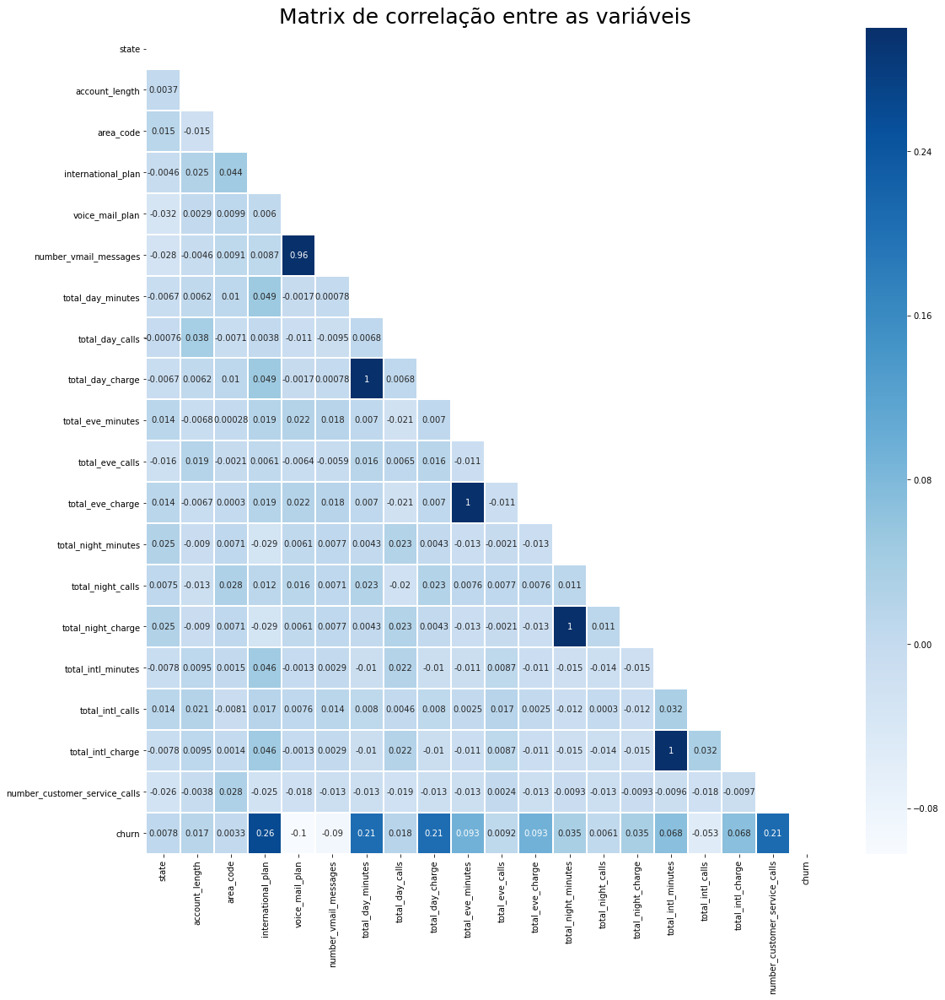

In [170]:
# Matrix de correlação:
corrMatrix = dadosTreinoDummy.corr()

# Configurando a dimensão do matrix:
plt.figure(figsize=(18, 18))

# Criando uma máscara, para exibir apenas a diagonal da matrix:
matrix = np.triu(corrMatrix)

# Criando a fução para plotar a matrix:
sns.heatmap(data = corrMatrix,
            cmap = 'Blues',
            mask=matrix,
            vmax = 0.30,
            linewidths = 1,
            annot=True)

# Inserindo um titulo:
plt.title("Matrix de correlação entre as variáveis", fontsize =25)

# Plotando a matrix de correlação:
plt.show()

<font color='DarkBlue'>Existe variáveis <b>altamente correlacionadas</b>, dentre elas, 5 estão <b>perfeitamente correlacionadas ('total_day_charge', 'total_eve_charge', 'total_night_charge', 'total_intl_charge' e 'number_vmail_messages')</b> e deverão ser eliminadas dos conjuntos de dados.

As variáveis <b>total_day_minutes</b>, <b>total_day_charge</b>, <b>number_customer_service_calls</b> e <b>international_plan</b> são as que apresentam as correlações mais fortes com a variável a ser prevista.

### <font color='DarkBlue'>5.3.1 - Removendo as variáveis altamente correlacionadas:</font>
<font color='DarkBlue'>Referência: https://stackoverflow.com/questions/29294983/how-to-calculate-correlation-between-all-columns-and-remove-highly-correlated-on

In [171]:
# Copiando o conjunto de dados para um novo dataframe:
dadosTreinoModificado = dadosTreinoDummy.copy()
dadosTesteModificado = dadosTesteDummy.copy()

# Colocando os valores da matrix de correlação em módulo:
corrMatrix_Nova = corrMatrix.abs()

# Selecionando o triângulo superior da matriz de correlação.
upper = corrMatrix_Nova.where(np.triu(np.ones(corrMatrix_Nova.shape), k = 1).astype(np.bool))

# Capturando o nome das variáveis que apresentam uma correlação maior do que 0.95.
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

# Exibindo o nome das variáveis altamente correlacionadas.
pd.DataFrame(data = to_drop, columns = ['Variáveis altamente correlacionadas'])

,Variáveis altamente correlacionadas
0,number_vmail_messages
1,total_day_charge
2,total_eve_charge
3,total_night_charge
4,total_intl_charge


In [172]:
# Copiando o conjunto de dados para um novo dataframe:
dadosTreinoModificado = dadosTreinoDummy.copy()
dadosTesteModificado = dadosTesteDummy.copy()

# Eliminando as variáveis altamente correlacionadas dos conjuntos de dados de treino e de teste.
dadosTreinoModificado = dadosTreinoModificado.drop(to_drop, axis = 1)
dadosTesteModificado = dadosTesteModificado.drop(to_drop, axis = 1)

In [173]:
# Dimensão anterior do dataset de treino:
print(dadosTreino.shape)

(3333, 20)


In [174]:
# Dimensão atual do dataset treino:
print(dadosTreinoModificado.shape)

(3333, 15)


In [175]:
# Dimensão anterior do dataset de teste:
print(dadosTeste.shape)

(1667, 20)


In [176]:
# Dimensão atual do dataset teste:
print(dadosTesteModificado.shape)

(1667, 15)


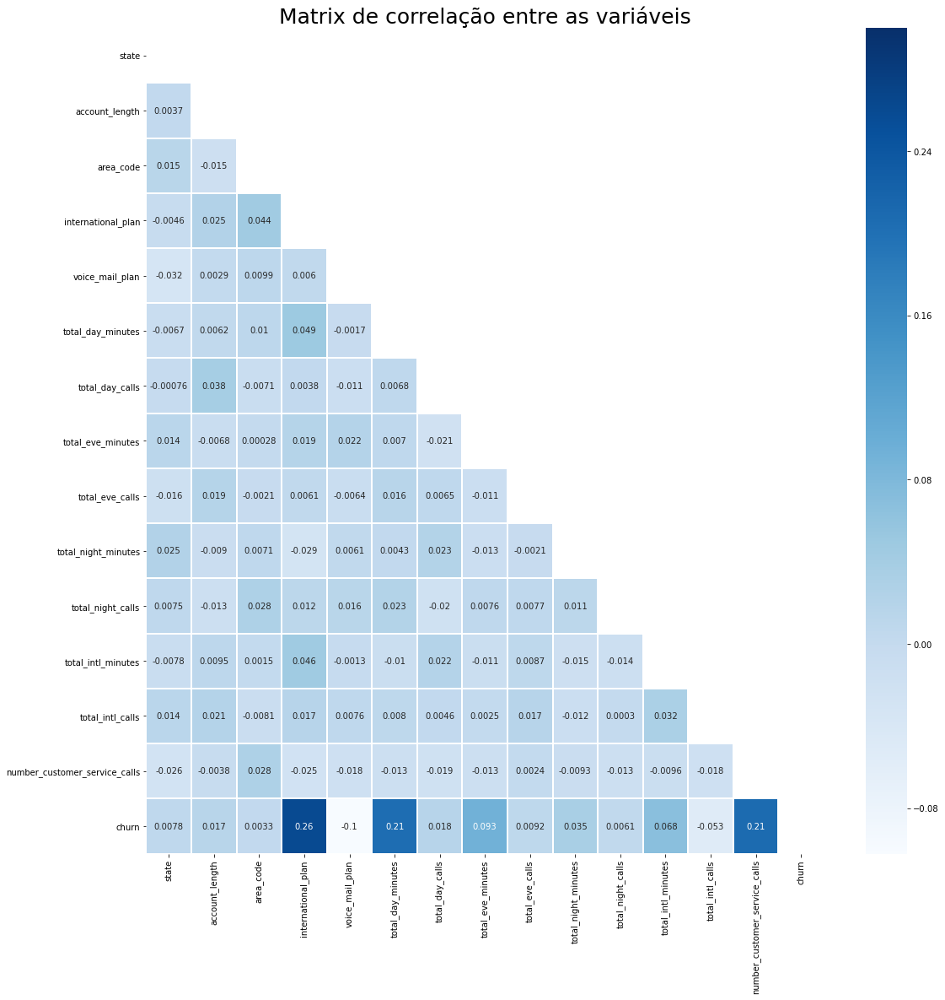

In [177]:
# Verificando a matrix de correlação sem as variáveis altamente correlaciondas:

# Matrix de correlação:
corrMatrixNew = dadosTreinoModificado.corr()

# Configurando a dimensão do matrix:
plt.figure(figsize=(18, 18))

# Criando uma máscara, para exibir apenas a diagonal da matrix:
matrix = np.triu(corrMatrixNew)

# Criando a fução para plotar a matrix:
sns.heatmap(data = corrMatrixNew,
            cmap = 'Blues',
            vmax = 0.30, 
            linewidths = 1,
            mask=matrix,
            annot=True)

# Inserindo um titulo:
plt.title("Matrix de correlação entre as variáveis", fontsize =25)

# Plotando a matrix de correlação:
plt.show()

# <font color='DarkBlue'>6 - Normalização e Padronização dos dados:</font>

<font color='DarkBlue'><b>Normalização:</b><br>
A normalização é uma técnica frequentemente aplicada à preparação dos dados em aprendizado de máquina. O objetivo da normalização é alterar os valores das colunas numéricas no conjunto de dados para uma escala comum, sem distorcer as diferenças nos intervalos de valores. Não precisamos aplicar normalização a todo conjunto de dados. É necessário apenas quando os recursos (variáveis) tiverem intervalos diferentes.<br><br>
    
<font color='DarkBlue'><b>Padronização:</b><br>
Padronização (ou normalização do escore Z ou em inglês Standardization ou ainda Standard Scaler) é o processo de redimensionamento dos recursos (variáveis) para que eles tenham as propriedades de uma distribuição normal com μ = 0 e σ = 1, onde μ é a média e σ é o desvio padrão da média.

In [178]:
# Criando cópias dos DataFrames:
trainFeatures = dadosTreinoModificado.copy()
testFeatures  = dadosTesteModificado.copy()

# Retirando a variável target do conjunto de dados:
trainFeatures = trainFeatures.drop(columns=['churn'])
testFeatures = testFeatures.drop(columns=['churn'])

# Criando um variável para identificar os dados de treino e de teste.
trainFeatures['train'] = 1
testFeatures['train']  = 0

In [179]:
# Separando a variável target (churn):
YTreino = dadosTreinoModificado['churn']
YTeste = dadosTesteModificado['churn']

In [180]:
# Unindo dados de treino e de teste em um único conjunto de dados.
features = pd.concat([trainFeatures, testFeatures])

In [181]:
# Capturando a variável que identifica os dados de treino e de teste.
train = features['train']

# Eliminando a variável de identificação do Dataframe.
features = features.drop(columns=['train'], axis = 1)

## <font color='DarkBlue'>6.1 - Normalização das variáveis:</font>

### <font color='DarkBlue'>6.1.1 - Método MinMaxScaler:
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html

In [182]:
# Criando um objeto da classe MinMaxScaler():
scaler = MinMaxScaler(feature_range = (0, 1))

# Aplicando a escala nas Features:
featuresTransformed_MM = scaler.fit_transform(features)

# Criando um dataframe com os dados normalizados pelo método MinMaxScaler:
featuresTransformed_MM = pd.DataFrame(data = featuresTransformed_MM, columns = features.columns)

# Atribuindo variável identificadora ao DataFrame transformado:
featuresTransformed_MM['train'] = train.values
featuresTransformed_MM.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls,train
0,0.32,0.524793,0.5,0.0,1.0,0.754196,0.666667,0.542755,0.582353,0.619494,0.520000,0.500,0.15,0.111111,1
1,0.70,0.438017,0.5,0.0,1.0,0.459744,0.745455,0.537531,0.605882,0.644051,0.588571,0.685,0.15,0.111111,1
2,0.62,0.561983,0.5,0.0,0.0,0.692461,0.690909,0.333242,0.647059,0.411646,0.594286,0.610,0.25,0.000000,1
3,0.70,0.342975,0.0,1.0,0.0,0.851778,0.430303,0.170195,0.517647,0.498481,0.508571,0.330,0.35,0.222222,1
4,0.72,0.305785,0.5,1.0,0.0,0.474253,0.684848,0.407754,0.717647,0.473165,0.691429,0.505,0.15,0.333333,1


#### <font color='DarkBlue'>6.1.1.1 - Dados de treino:

In [183]:
# Separando dados de treino:
trainFeatures_MM  = featuresTransformed_MM[featuresTransformed_MM['train'] == 1].drop(columns=['train'], axis = 1)
trainFeatures_MM.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
0,0.32,0.524793,0.5,0.0,1.0,0.754196,0.666667,0.542755,0.582353,0.619494,0.520000,0.500,0.15,0.111111
1,0.70,0.438017,0.5,0.0,1.0,0.459744,0.745455,0.537531,0.605882,0.644051,0.588571,0.685,0.15,0.111111
2,0.62,0.561983,0.5,0.0,0.0,0.692461,0.690909,0.333242,0.647059,0.411646,0.594286,0.610,0.25,0.000000
3,0.70,0.342975,0.0,1.0,0.0,0.851778,0.430303,0.170195,0.517647,0.498481,0.508571,0.330,0.35,0.222222
4,0.72,0.305785,0.5,1.0,0.0,0.474253,0.684848,0.407754,0.717647,0.473165,0.691429,0.505,0.15,0.333333


#### <font color='DarkBlue'>6.1.1.2 - Dados de teste:

In [184]:
# Separando dados de teste:
testFeatures_MM = featuresTransformed_MM[featuresTransformed_MM['train'] == 0].drop(columns=['train'], axis = 1)
testFeatures_MM.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
3333,0.22,0.413223,1.0,0.0,0.0,0.201707,0.745455,0.582623,0.429412,0.597468,0.417143,0.530,0.15,0.333333
3334,0.52,0.561983,1.0,0.0,0.0,0.636131,0.521212,0.673082,0.817647,0.238481,0.462857,0.475,0.35,0.000000
3335,0.70,0.421488,0.0,0.0,1.0,0.838407,0.575758,0.652461,0.617647,0.760253,0.725714,0.685,0.30,0.111111
3336,0.64,0.404959,0.5,0.0,0.0,0.616785,0.745455,0.347539,0.517647,0.558481,0.468571,0.785,0.10,0.111111
3337,0.80,0.442149,0.5,0.0,0.0,0.561593,0.472727,0.340940,0.594118,0.517722,0.611429,0.385,0.20,0.222222


### <font color='DarkBlue'>6.1.2 - Método Normalizer:
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Normalizer.html

In [185]:
# Criando um objeto da classe Normalizer():
scaler = Normalizer().fit(features)

# Aplicando a escala nas Features:
featuresTransformed_N = scaler.fit_transform(features)

# Criando um dataframe com os dados normalizados pelo método Normalizer:
featuresTransformed_N = pd.DataFrame(data = featuresTransformed_N, columns = features.columns)

# Atribuindo variável identificadora ao DataFrame transformado:
featuresTransformed_N['train'] = train.values
featuresTransformed_N.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls,train
0,0.034422,0.275376,0.002151,0.000000,0.002151,0.570329,0.236651,0.424681,0.212986,0.526441,0.195775,0.021514,0.006454,0.002151,1
1,0.082894,0.253419,0.002368,0.000000,0.002368,0.382733,0.291313,0.463022,0.243945,0.602521,0.243945,0.032447,0.007105,0.002368,1
2,0.078440,0.346654,0.002530,0.000000,0.000000,0.615880,0.288456,0.306675,0.278335,0.411430,0.263153,0.030870,0.012652,0.000000,1
3,0.087140,0.209135,0.000000,0.002490,0.000000,0.745417,0.176769,0.154113,0.219094,0.490223,0.221584,0.016432,0.017428,0.004979,1
4,0.098326,0.204846,0.002731,0.002731,0.000000,0.455304,0.308634,0.405049,0.333216,0.510476,0.330485,0.027586,0.008194,0.008194,1


#### <font color='DarkBlue'>6.1.2.1 - Dados de treino:

In [186]:
# Separando dados de treino:
trainFeatures_N  = featuresTransformed_N[featuresTransformed_N['train'] == 1].drop(columns=['train'], axis = 1)
trainFeatures_N.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
0,0.034422,0.275376,0.002151,0.000000,0.002151,0.570329,0.236651,0.424681,0.212986,0.526441,0.195775,0.021514,0.006454,0.002151
1,0.082894,0.253419,0.002368,0.000000,0.002368,0.382733,0.291313,0.463022,0.243945,0.602521,0.243945,0.032447,0.007105,0.002368
2,0.078440,0.346654,0.002530,0.000000,0.000000,0.615880,0.288456,0.306675,0.278335,0.411430,0.263153,0.030870,0.012652,0.000000
3,0.087140,0.209135,0.000000,0.002490,0.000000,0.745417,0.176769,0.154113,0.219094,0.490223,0.221584,0.016432,0.017428,0.004979
4,0.098326,0.204846,0.002731,0.002731,0.000000,0.455304,0.308634,0.405049,0.333216,0.510476,0.330485,0.027586,0.008194,0.008194


#### <font color='DarkBlue'>6.1.2.2 - Dados de teste:

In [187]:
# Separando dados de teste:
testFeatures_N = featuresTransformed_N[featuresTransformed_N['train'] == 0].drop(columns=['train'], axis = 1)
testFeatures_N.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
3333,0.029205,0.268151,0.005310,0.0,0.000000,0.188237,0.326560,0.562586,0.193812,0.626571,0.193812,0.028143,0.007965,0.007965
3334,0.062753,0.330660,0.004827,0.0,0.000000,0.539675,0.207567,0.590843,0.335487,0.227359,0.195499,0.022929,0.016895,0.000000
3335,0.065958,0.194105,0.000000,0.0,0.001885,0.555368,0.179029,0.447196,0.197874,0.565921,0.239334,0.025818,0.011307,0.001885
3336,0.081993,0.253664,0.002562,0.0,0.000000,0.555499,0.315159,0.323870,0.225479,0.565236,0.210106,0.040228,0.005125,0.002562
3337,0.107974,0.291529,0.002699,0.0,0.000000,0.532850,0.210549,0.334718,0.272633,0.552015,0.288829,0.020785,0.010797,0.005399


## <font color='DarkBlue'>6.2 - Padronização das variáveis pelo método StandardScaler:</font>
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

In [188]:
# Criando um objeto da classe StandardScaler:
scaler = StandardScaler().fit(features)

# Aplicando a escala nas Features:
featuresTransformed_SS = scaler.fit_transform(features)

# Criando um dataframe com os dados normalizados pelo método StandardScaler:
featuresTransformed_SS = pd.DataFrame(data = featuresTransformed_SS, columns = features.columns)

# Atribuindo variável identificadora ao DataFrame transformado:
featuresTransformed_SS['train'] = train.values
featuresTransformed_SS.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls,train
0,-0.675476,0.698941,0.003673,-0.323240,1.667120,1.573802,0.502824,-0.064032,-0.060077,0.876999,-0.446928,-0.094809,-0.584236,-0.436676,1
1,0.608134,0.169849,0.003673,-0.323240,1.667120,-0.346802,1.158422,-0.101621,0.141693,1.068992,0.154374,1.245227,-0.584236,-0.436676,1
2,0.337900,0.925695,0.003673,-0.323240,-0.599837,1.171125,0.704546,-1.571562,0.494791,-0.748012,0.204483,0.701969,0.229917,-1.202236,1
3,0.608134,-0.409634,-1.409138,3.093675,-0.599837,2.210292,-1.463971,-2.744745,-0.614946,-0.069110,-0.547145,-1.326194,1.044069,0.328885,1
4,0.675692,-0.636388,0.003673,3.093675,-0.599837,-0.252163,0.654116,-1.035419,1.100103,-0.267041,1.056327,-0.058592,-0.584236,1.094445,1


### <font color='DarkBlue'>6.2.1 - Dados de treino:

In [189]:
# Separando dados de treino:
trainFeatures_SS  = featuresTransformed_SS[featuresTransformed_SS['train'] == 1].drop(columns=['train'], axis = 1)
trainFeatures_SS.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
0,-0.675476,0.698941,0.003673,-0.323240,1.667120,1.573802,0.502824,-0.064032,-0.060077,0.876999,-0.446928,-0.094809,-0.584236,-0.436676
1,0.608134,0.169849,0.003673,-0.323240,1.667120,-0.346802,1.158422,-0.101621,0.141693,1.068992,0.154374,1.245227,-0.584236,-0.436676
2,0.337900,0.925695,0.003673,-0.323240,-0.599837,1.171125,0.704546,-1.571562,0.494791,-0.748012,0.204483,0.701969,0.229917,-1.202236
3,0.608134,-0.409634,-1.409138,3.093675,-0.599837,2.210292,-1.463971,-2.744745,-0.614946,-0.069110,-0.547145,-1.326194,1.044069,0.328885
4,0.675692,-0.636388,0.003673,3.093675,-0.599837,-0.252163,0.654116,-1.035419,1.100103,-0.267041,1.056327,-0.058592,-0.584236,1.094445


### <font color='DarkBlue'>6.2.2 - Dados de teste:

In [190]:
# Separando dados de teste:
testFeatures_SS = featuresTransformed_SS[featuresTransformed_SS['train'] == 0].drop(columns=['train'], axis = 1)
testFeatures_SS.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
3333,-1.013268,0.018679,1.416484,-0.32324,-0.599837,-2.029881,1.158422,0.222834,-1.371585,0.704799,-1.348881,0.122494,-0.584236,1.094445
3334,0.000108,0.925695,1.416484,-0.32324,-0.599837,0.803705,-0.707512,0.873723,1.957627,-2.101858,-0.948013,-0.275895,1.044069,-1.202236
3335,0.608134,0.069069,-1.409138,-0.32324,1.667120,2.123076,-0.253636,0.725344,0.242578,1.977493,1.356979,1.245227,0.636993,-0.436676
3336,0.405459,-0.031710,0.003673,-0.32324,-0.599837,0.677520,1.158422,-1.468686,-0.614946,0.399986,-0.897904,1.969571,-0.991312,-0.436676
3337,0.945926,0.195044,0.003673,-0.32324,-0.599837,0.317523,-1.110957,-1.516167,0.040808,0.081317,0.354808,-0.927805,-0.177160,0.328885


# <font color='DarkBlue'>7 - Feature Selection (Seleção de variáveis):</font>
<font color='DarkBlue'>Os atributos (variáveis) presentes no seu dataset e que você utiliza nos dados de treino, terão grande influência na precisão e resultado do seu modelo preditivo. Atributos irrelevantes terão impacto negativo na performance, enquanto atributos colineares podem afetar o grau de acurácia do modelo. O Scikit-learn possui funções que automatizam o trabalho de extração e seleção de variáveis.

A etapa de Feature Selection é onde selecionamos os atributos (variáveis) que serão melhores candidatas a variáveis preditoras. O Feature Selection nos ajuda a reduzir o overfitting (quando o algoritmo aprende demais), aumenta a acurácia do modelo e reduz o tempo de treinamento.

In [191]:
# Criando um array com o conjunto de dados ja normalizado pelo método MinMaxScaler:
array_MM = trainFeatures_MM.values

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
X_MM = array_MM[ : , 0:14]
Y_MM = YTreino.copy()

In [192]:
trainFeatures_MM

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
0,0.32,0.524793,0.5,0.0,1.0,0.754196,0.666667,0.542755,0.582353,0.619494,0.520000,0.500,0.15,0.111111
1,0.70,0.438017,0.5,0.0,1.0,0.459744,0.745455,0.537531,0.605882,0.644051,0.588571,0.685,0.15,0.111111
2,0.62,0.561983,0.5,0.0,0.0,0.692461,0.690909,0.333242,0.647059,0.411646,0.594286,0.610,0.25,0.000000
3,0.70,0.342975,0.0,1.0,0.0,0.851778,0.430303,0.170195,0.517647,0.498481,0.508571,0.330,0.35,0.222222
4,0.72,0.305785,0.5,1.0,0.0,0.474253,0.684848,0.407754,0.717647,0.473165,0.691429,0.505,0.15,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,0.06,0.789256,0.5,0.0,1.0,0.444381,0.466667,0.592521,0.741176,0.706582,0.474286,0.495,0.30,0.222222
3329,0.98,0.276860,0.5,0.0,0.0,0.657468,0.345455,0.421776,0.323529,0.484304,0.702857,0.480,0.20,0.333333
3330,0.78,0.111570,1.0,0.0,0.0,0.514367,0.660606,0.794061,0.341176,0.485823,0.520000,0.705,0.30,0.222222
3331,0.12,0.756198,1.0,1.0,0.0,0.608250,0.636364,0.438823,0.494118,0.352405,0.782857,0.250,0.50,0.222222


## <font color='DarkBlue'>7.1 - Método de Seleção univariada - SelectkBest():</font>
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html

<font color='DarkBlue'>Testes estatísticos podem ser usados para selecionar os atributos que possuem forte relacionamento com a variável que estamos tentando prever. O Scikit-learn fornece a função SelectKBest() que pode ser usada com diversos testes estatísticos, para selecionar os atributos. Vamos usar o teste qui-quadrado e selecionar os melhores atributos que podem ser usados como variáveis preditoras.

In [193]:
# Instanciando um objeto da classe SelectKBest, para selecionar as melhores variáveis preditoras:
SKB = SelectKBest(score_func = chi2, k = 14)

# Capturando os scores das variáveis preditoras.
bestFeaturesSKB = SKB.fit_transform(X_MM, Y_MM)

# Capturando o nome das variáveis preditoras.
nomeVarSKB = trainFeatures_MM.columns[SKB.get_support()]

# Exibindo o nome das variáveis preditoras.
nomeVarSKB

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'total_day_minutes', 'total_day_calls',
       'total_eve_minutes', 'total_eve_calls', 'total_night_minutes',
       'total_night_calls', 'total_intl_minutes', 'total_intl_calls',
       'number_customer_service_calls'],
      dtype='object')

In [194]:
# Criando um DataFrame, com os scores obtidos para cada uma das Features, segundo a técnica utilizada.
SC_SKB = pd.Series(SKB.scores_, index = trainFeatures_MM.columns)

# Capturando os scores das variáveis preditoras:
SC_SKB = SC_SKB[SKB.get_support()]

# Ordenando o Dataframe com os scores de forma decrescente:
SC_SKB = SC_SKB.sort_values(ascending = False)

# Criando um dataframe com o resultado:
data = {
        'Rank das Variáveis': SC_SKB
        }
SC_SKB_df = pd.DataFrame(data)
SC_SKB_df

,Rank das Variáveis
international_plan,203.244178
voice_mail_plan,25.156959
number_customer_service_calls,17.863732
total_day_minutes,6.583696
total_eve_minutes,1.009526
total_intl_calls,0.629138
total_intl_minutes,0.590654
total_night_minutes,0.135308
account_length,0.059699
state,0.034021


In [195]:
# Plotando um gráfico de barras para os scores das variáveis
fig = px.bar(SC_SKB,
             x=SC_SKB.index,
             y=SC_SKB.values,
             labels={
                     'index' : "Feature",
                     'y' : 'Score'
                    },
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Scores das features com o SelectKBest", "x": 0.0},
                  yaxis_title="Score",
                  xaxis_title='Features'
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

## <font color='DarkBlue'>7.2 - Método de Eliminação Recursiva de Atributos - RFE:</font>
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

<font color='DarkBlue'>Esta é outra técnica para seleção de atributos, que recursivamente remove os atributos e constrói o modelo com os atributos remanescentes. Em inglês esta técnia é chamada Recursive Feature Elimination (RFE).<br>
    
<b>RFE</b> é um algoritmo de seleção de recurso do <b>tipo Wrapper</b>. Na abordagem <b>Wrapper</b>, o algoritmo de classificação é executado para cada subconjunto e a avaliação geralmente é feita em termos da acurácia preditiva retornada pelo algoritmo. O subconjunto que trouxer o melhor desempenho de aprendizado é definido como o melhor subconjunto de atributos.<br><br>

Isso significa que um algoritmo de aprendizado de máquina é fornecido e usado no núcleo do método, é empacotado pelo RFE e usado para ajudar a selecionar recursos. Isso contrasta com as seleções de recursos com base em filtro que pontuam cada recurso e selecionam os recursos com a maior (ou menor) pontuação.<br>

O RFE funciona procurando por um subconjunto de recursos começando com todos os recursos no conjunto de dados de treinamento e removendo com sucesso os recursos até que o número desejado permaneça.

Isso é obtido ajustando-se o algoritmo de aprendizado de máquina usado no núcleo do modelo, classificando os recursos por importância, descartando os recursos menos importantes e reajustando o modelo. Este processo é repetido até que um determinado número de recursos permaneça.

O exemplo abaixo utiliza a técnica de eliminação recursiva de atributos combinado com algum algoritmo de classificação, que nesse caso, será usado o XGBoost.O nome XGBoost vem de e<b>X</b>treme <b>G</b>radient <b>B</b>oosting, e representa uma categoria de algoritmo baseada em Decision Trees (árvores de decisão) com Gradient Boosting (aumento de gradiente).<br>

O método será configurado para coletar as <b>6 variáveis</b> preditoras mais relevantes, que serão marcadas como <b>"True"</b> em <b>"Variáveis Selecionadas"</b> e com valor <b>1</b> em <b>"Rank das Variáveis"</b>.

In [196]:
# Criação do modelo
modelo_XGB = xgb.XGBClassifier(eval_metric='mlogloss')

# Instanciando um objeto da classe RFE, para selecionar as melhores variáveis preditoras:
rfe = RFE(estimator = modelo_XGB,
          n_features_to_select = 6)

# Capturando as melhores variáveis preditoras.
rfeFit = rfe.fit(X_MM, Y_MM)

# Coletando o nome das colunas:
NomeCol = trainFeatures_MM.columns[0:14]

# Verificando as variaveis mais relevantes:
VarSelecionadas = rfeFit.support_

# Rank das variáveis mais relevantes:
VarRank = rfeFit.ranking_

# Criando um dataframe com o resultado:
data = {
        'Variáveis Selecionadas': VarSelecionadas,
        'Rank das Variáveis': VarRank
        }
SC_RFE = pd.DataFrame(data, index = [NomeCol])

# Ordenando pelo rank das variáveis, da mais relevante para a menos relevante:
SC_RFE.sort_values('Rank das Variáveis')

,Variáveis Selecionadas,Rank das Variáveis
international_plan,True,1
voice_mail_plan,True,1
total_day_minutes,True,1
total_intl_minutes,True,1
total_intl_calls,True,1
number_customer_service_calls,True,1
total_eve_minutes,False,2
total_night_minutes,False,3
total_eve_calls,False,4
total_night_calls,False,5


## <font color='DarkBlue'>7.3 - Método Ensemble para Seleção de Variáveis - ExtraTreesClassifier:</font>
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html

<font color='DarkBlue'>Bagged Decision Trees, como o algoritmo RandomForest (esses são chamados de Métodos Ensemble), podem ser usados para estimar a importância de cada atributo. Esse método retorna um score para cada atributo. Quanto maior o score, maior a importância do atributo.
    
    
O <b>Extremely Randomized Trees Classifier (Extra Trees Classifier)</b> é um tipo de técnica de aprendizagem de conjunto que agrega os resultados de várias árvores de decisão descorrelacionadas coletadas em uma “floresta” para produzir seu resultado de classificação. Em conceito, é muito semelhante a um Classificador Random Forest e só difere na forma de construção das árvores de decisão na floresta.<br><br>

Cada árvore de decisão na floresta de árvores extras é construída a partir da amostra de treinamento original. Então, em cada nó de teste, cada árvore é fornecida com uma amostra aleatória de k recursos do conjunto de recursos a partir do qual cada árvore de decisão deve selecionar o melhor recurso para dividir os dados com base em alguns critérios matemáticos (normalmente o índice de Gini). Essa amostra aleatória de recursos leva à criação de várias árvores de decisão não correlacionadas.

Para realizar a seleção de características usando a estrutura de floresta acima, durante a construção da floresta, para cada característica, a redução total normalizada nos critérios matemáticos usados ​​na decisão da característica de divisão (Índice de Gini se o Índice de Gini for usado na construção de floresta) é computado. Esse valor é chamado de Importância Gini do recurso. Para realizar a seleção de recursos, cada recurso é ordenado em ordem decrescente de acordo com a Importância Gini de cada recurso e o usuário seleciona os k principais recursos de acordo com sua escolha.

In [197]:
# Criação do modelo
modelo_ETC = ExtraTreesClassifier()

# Capturando as melhores variáveis preditoras.
ETC = modelo_ETC.fit(X_MM, Y_MM)

# Coletando o nome das colunas:
NomeCol = trainFeatures_MM.columns[0:14]


# Rank das variáveis mais relevantes:
VarRank = ETC.feature_importances_

# Criando um dataframe com o resultado:
data = {
        'Rank das Variáveis': VarRank
        }
SC_RFE = pd.DataFrame(data, index = [NomeCol])

# Ordenando pelo rank das variáveis, da mais relevante para a menos relevante:
SC_RFE = SC_RFE.sort_values('Rank das Variáveis')
SC_RFE

,Rank das Variáveis
voice_mail_plan,0.018867
area_code,0.036434
total_night_calls,0.052186
state,0.053258
total_eve_calls,0.056927
account_length,0.057018
total_day_calls,0.058643
total_night_minutes,0.060850
total_intl_calls,0.067192
total_intl_minutes,0.068700


In [198]:
# Plotando um gráfico de barras para os scores das variáveis

# Criando um dataframe com os valores:
df_ETC = pd.Series(VarRank, index = trainFeatures_MM.columns).sort_values(ascending = False)

# Criando uma figure para o gráfico:
fig = px.bar(df_ETC,
             x=df_ETC.index,
             y=df_ETC.values,
             labels={
                     'index' : "Feature",
                     'y' : 'Score'
                    },
             color_discrete_map = {'': 'rgb(32,178,170)'},
             opacity= 0.6
            )

# Inserindo o titulo e nome nos eixos:
fig.update_layout(title={"text": "Scores das features com o  ExtraTreesClassifier", "x": 0.0},
                  yaxis_title="Score",
                  xaxis_title='Features'
                 )

# Ajustando o eixo x do gráfico para categórico:
fig.update_xaxes(type='category')

# Plotando o gráfico:
fig.show()

## <font color='DarkBlue'>7.4 - Método de redução de dimensionalidade - Principal Component Analysis (PCA):</font>
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

<font color='DarkBlue'>A <b>Análise de componente principal (Principal Component Analysis - PCA) </b>é uma técnica de redução de dimensionalidade linear que pode ser utilizada para extrair informações de um espaço de alta dimensão projetando-as em um subespaço de dimensão inferior. Ele tenta preservar as partes essenciais que têm mais variação dos dados e remover as partes não essenciais com menos variação. As dimensões nada mais são do que recursos que representam os dados.

Uma coisa importante a se notar sobre o PCA é que é uma técnica de redução de dimensionalidade <b>não supervisionada</b>. Você pode agrupar os pontos de dados semelhantes com base na correlação de recursos entre eles sem qualquer supervisão (ou rótulos).<br><br>

O PCA precisa ser alimentado com dados normalizados. Utilizar o PCA em dados não normalizados pode gerar resultados inesperados.<br>

Será utilizada a técnica de PCA para selecionar 5 componentes principais.

In [199]:
# Exibindo o dataset que será utilizado:
featuresTransformed_MM.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls,train
0,0.32,0.524793,0.5,0.0,1.0,0.754196,0.666667,0.542755,0.582353,0.619494,0.520000,0.500,0.15,0.111111,1
1,0.70,0.438017,0.5,0.0,1.0,0.459744,0.745455,0.537531,0.605882,0.644051,0.588571,0.685,0.15,0.111111,1
2,0.62,0.561983,0.5,0.0,0.0,0.692461,0.690909,0.333242,0.647059,0.411646,0.594286,0.610,0.25,0.000000,1
3,0.70,0.342975,0.0,1.0,0.0,0.851778,0.430303,0.170195,0.517647,0.498481,0.508571,0.330,0.35,0.222222,1
4,0.72,0.305785,0.5,1.0,0.0,0.474253,0.684848,0.407754,0.717647,0.473165,0.691429,0.505,0.15,0.333333,1


In [200]:
# Eliminando a variável de identificação do Dataframe.
featuresPCA = featuresTransformed_MM.drop(columns=['train'], axis = 1)
featuresPCA

,state,account_length,area_code,international_plan,voice_mail_plan,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
0,0.32,0.524793,0.5,0.0,1.0,0.754196,0.666667,0.542755,0.582353,0.619494,0.520000,0.500,0.15,0.111111
1,0.70,0.438017,0.5,0.0,1.0,0.459744,0.745455,0.537531,0.605882,0.644051,0.588571,0.685,0.15,0.111111
2,0.62,0.561983,0.5,0.0,0.0,0.692461,0.690909,0.333242,0.647059,0.411646,0.594286,0.610,0.25,0.000000
3,0.70,0.342975,0.0,1.0,0.0,0.851778,0.430303,0.170195,0.517647,0.498481,0.508571,0.330,0.35,0.222222
4,0.72,0.305785,0.5,1.0,0.0,0.474253,0.684848,0.407754,0.717647,0.473165,0.691429,0.505,0.15,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.22,0.202479,0.0,0.0,1.0,0.670555,0.769697,0.613143,0.741176,0.753165,0.662857,0.495,0.25,0.222222
4996,0.98,0.623967,0.5,0.0,0.0,0.524040,0.545455,0.706076,0.429412,0.540759,0.645714,0.735,0.10,0.333333
4997,0.14,0.247934,0.5,0.0,0.0,0.400000,0.539394,0.475117,0.752941,0.537722,0.554286,0.680,0.20,0.111111
4998,0.14,0.446281,1.0,0.0,0.0,0.537127,0.406061,0.472092,0.541176,0.568101,0.508571,0.425,0.30,0.000000


In [201]:
# Criando uma variável com o numero de componente:
NumComp = 5

# Instanciando um objeto da classe PCA para criar os componentes.
pca = PCA(n_components = NumComp)

# Capturando os componentes
compPCA = pca.fit_transform(featuresPCA)

# Criando um dataframe com os valores dos componentes:
df_PCA = pd.DataFrame(data = compPCA, columns = ['PCA_' + str(i) for i in range(0, NumComp)])

# Visualizando os componentes:
df_PCA.head()

,PCA_0,PCA_1,PCA_2,PCA_3,PCA_4
0,0.741355,-0.020342,-0.189522,-0.047653,0.119049
1,0.727933,-0.005323,0.171444,-0.152424,0.037002
2,-0.270369,-0.003648,0.066250,-0.105028,0.161414
3,-0.269195,-0.420489,0.432975,0.853984,-0.086763
4,-0.263414,0.080778,0.419716,0.817287,-0.111857


In [202]:
# Separando os dados de treino:
trainFeatures_PCA = df_PCA[0:3333]
len(trainFeatures_PCA)

3333

In [203]:
# Separando os dados de teste
testFeatures_PCA = df_PCA[3333:5000]
len(testFeatures_PCA)

1667

# <font color='DarkBlue'>8 - Modelagem Preditiva:</font>

## <font color='DarkBlue'>8.1 - Criando funções auxiliares:</font>

<font color='DarkBlue'>Link de referência:<br>
https://machinelearningmastery.com/compare-machine-learning-algorithms-python-scikit-learn/

In [204]:
# Definindo uma função, para treinar diferentes algoritmos, e prever a variável Target de um conjunto de dados.
def classifiersTraining(X, Y):

    # Definindo os valores do seed e do número de folds.
    seed = 5
    num_folds = 10

    # Criando uma lista, para armazenar os modelos que serão utilizados.
    models = []

    # Criando Listas para armazenar os resultados, os nomes de cada um dos algoritmos testados e a forma do score:
    results = []
    names   = []
    scoring = 'accuracy'

    # Criando um Dataframe para armazenar a média e o desvio-padrão de cada um dos algoritmos testados.
    means   = pd.DataFrame(columns = ['mean', 'std'])

    # Adicionando os modelos a lista.
    models.append(('LR'      , LogisticRegression()         ))
    models.append(('LDA'     , LinearDiscriminantAnalysis() ))
    models.append(('NB'      , GaussianNB()                 ))
    models.append(('KNN'     , KNeighborsClassifier()       ))
    models.append(('CART'    , DecisionTreeClassifier()     ))
    models.append(('AdaBoost', AdaBoostClassifier()         ))
    models.append(('GB'      , GradientBoostingClassifier() ))
    models.append(('SVM'     , SVC()                        ))
    models.append(('RF'      , RandomForestClassifier()     ))
    models.append(('XGBoost' , xgb.XGBClassifier(eval_metric='mlogloss')))

    # Avaliando cada um dos modelos da lista de modelos.
    for name, model in models:

        # Instanciando um objeto da classe Kfold para criar os folds.
        kfold = model_selection.KFold(n_splits = num_folds, random_state = seed)

        # Treinando o modelo com Cross Validation.
        cv_results = model_selection.cross_val_score(model, X, Y, cv = kfold, scoring = scoring)

        # Adicionando os resultados gerados na lista de resultados.
        results.append(cv_results)

        # Adicionando o nome do modelo avaliado na lista de nomes.
        names.append(name)

        # Adicionando a média e o desvio-padrão, dos resultados gerados pelo modelo analisado, ao Dataframe de médias.
        means = means.append (
                pd.DataFrame (
                    data    = [[cv_results.mean(), cv_results.std()]], 
                    columns = ['mean', 'std'], 
                    index   = [name]
                              )
                            )

        # Imprime uma mensagem, contendo os resultados obtidos ao fim do treinamento, de cada um dos modelos.
        # Cria a mensagem a ser impressa.
        msg = "%s - Média = %f // Desvio padrão = %f" % (name, cv_results.mean(), cv_results.std())

        # Imprime a mensagem.
        print(msg) 
    
    # Cria um DataFrame, com os resultados obtidos por cada um dos modelos avaliados.
    df = pd.DataFrame(np.transpose(results), columns = names)
    
    # Retorna o DataFrame, com os resultados e com as médias geradas.
    return(df)

In [205]:
# Definindo uma função, para realizar o cálculo do Intervalo de Confiança, da acurácia e do erro de modelos 
# preditivos de classificação.

def CI(score, nElements,  ci = .95):

    # Define o Z-score, a ser utilizado para o Intervalo de Confiança selecionado.
    z = {
        .90  : 1.645,      # Para Intervalos com 90% de Confiança.
        .95  : 1.96,       # Para Intervalos com 95% de Confiança.
        .98  : 2.326,      # Para Intervalos com 98% de Confiança.
        .99  : 2.576,      # Para Intervalos com 99% de Confiança.
        .995 : 2.807,      # Para Intervalos com 99.5% de Confiança.
        .999 : 3.291       # Para Intervalos com 99.9% de Confiança.
    }

    # Calculando o range de variação do Intervalo.
    interval = z.get(ci) * np.sqrt( (score * (1 - score)) / nElements)

    # Retornando o Intervalo de Confiança obtido.
    return score - interval, score + interval

In [206]:
# Definindo uma função, para criar uma Confusion Matrix.

def confusionMatrix(yTrue, yPred, labelPositive = 'Yes', labelNegative = 'False', classError = True):

    # Convertendo arrays para o tipo de dado categórico.
    yTrue = pd.Categorical(values = yTrue, categories = labels)
    yPred = pd.Categorical(values = yPred, categories = labels)

    # Transformando arrays em Séries Temporais.
    yPred = pd.Series(data = yPred, name = 'Predicted')
    yTrue = pd.Series(data = yTrue, name = 'Actual')

    # Criando a Confusion Matrix.
    cm = pd.crosstab(index = yPred, columns = yTrue, dropna = False)

    # Calculando os erros das classes da Confusion Matrix.
    if classError:
        
        # Capturando cada um dos valores da Confusion Matrix.
        truePositve, falsePositive, falseNegative, trueNegative = np.array(cm).ravel()

        # Criando um DataFrame contendo os erros das classes.
        ce = pd.DataFrame (
            data = [
                falsePositive / (truePositve + falsePositive),
                1 - trueNegative / (trueNegative + falseNegative)
            ],
            columns = ['classError'],
            index   = labels
        )

        # Inserindo no DataFrame, as colunas da Confusion Matrix.
        for c in range(cm.shape[1] - 1, -1, -1):
            
            # Inserindo as colunas no DataFrame.
            ce.insert(loc = 0, column = labels[c], value = cm[labels[c]])

        # Atribuindo índices e colunas ao DataFrame.
        ce.index   = pd.Series(ce.index, name = 'Predicted')
        ce.columns = pd.Series(ce.columns, name = 'Actual')

        # Retornando a Confusion Matrix com o erro das classes.
        return ce

    # Retornando Confusion Matrix.
    return cm

In [207]:
# Definindo uma função, para calcular as métricas baseadas na Confusion Matrix.

def getClassificationMetrics(yTrue, predProb, labelPositive = 'Yes', labelNegative = 'No'):


    # Binarizando os scores obtidos nas previsões.
    yPred = [labelPositive if v >= 0.5 else labelNegative for v in predProb]
    
    # Convertendo arrays para o tipo categórico.
    labels = [labelPositive, labelNegative]

    yTrue = pd.Categorical(values = yTrue, categories = labels)
    yPred = pd.Categorical(values = yPred, categories = labels)

    # Convertendo arrays para o tipo numérico. 
    yNTrue = [1 if v == labelPositive else 0 for v in yTrue]
    yNPred = [1 if v == labelPositive else 0 for v in yPred]

    # Transformando arrays em Séries Temporais.
    yPred = pd.Series(data = yPred, name = 'Predicted')
    yTrue = pd.Series(data = yTrue, name = 'Actual')

    # Criando a Confusion Matrix.
    cm = confusionMatrix(yTrue, yPred, labelPositive = labelPositive, labelNegative = labelNegative, classError = False)

    # Capturando cada um dos valores da Confusion Matrix.
    truePositve, falsePositive, falseNegative, trueNegative = np.array(cm).ravel()

    # Calculando as métricas.
    accuracy     = accuracy_score(yTrue, yPred)
    accuracyCI   = CI(accuracy_score(yTrue, yPred), len(yTrue))
    kappa        = cohen_kappa_score(yTrue, yPred)
    sensitivity  = recall_score(yNTrue, yNPred)
    specificity  = trueNegative /(trueNegative + falsePositive)
    prevalence   = (truePositve + falseNegative) / len(yTrue)
    ppv          = (sensitivity * prevalence) /((sensitivity * prevalence) + ((1 - specificity) * (1 - prevalence)))
    npv          = (specificity * (1 - prevalence)) / (((1 - sensitivity) * prevalence) + ((specificity) * (1 - prevalence)))
    precision    = precision_score(yNTrue, yNPred)
    avgPrecision = average_precision_score(yNTrue, yNPred)
    dRate        = truePositve / len(yTrue)
    dPrevalence  = (truePositve + falsePositive) / len(yTrue)
    f1           = f1_score(yNTrue, yNPred)
    rocAuc       = roc_auc_score(yNTrue, predProb)
    error        = 1 - accuracy_score(yTrue, yPred)
    errorCI      = CI(error, len(yTrue))
    bAccuracy    = balanced_accuracy_score(yTrue, yPred)

    # Criando um DataFrame, com o resultado das métricas calculadas.
    metrics = pd.DataFrame([{
        'Accuracy'            : accuracy,     # Determina a precisão geral prevista do modelo.
        '95% CI for Accuracy' : accuracyCI,   # Determina um intervalo de confiança de 95% para a acurácia.
        'Kappa'               : kappa,        # Determina o coeficiente de Kappa.
        'Recall (Sensitivity)': sensitivity,  # Determina a proporção de registros positivos que foram classificados
                                              # pelo algoritmo  como positivos.
        'Specificity'         : specificity,  # Determina a proporção de registros negativos que foram classificados 
                                              # pelo algoritmo como negativos.
        'Pos Pred Value'      : ppv,          # Determina a porcentagem de positivos previstos que são realmente positivos.
        'Neg Pred Value'      : npv,          # Determina a porcentagem de negativos previstos que são realmente negativos.
        'Precision'           : precision,    # Determina a proporção de classificações positivas, que realmente 
                                              # são positivas.
        'Avarage Precision'   : avgPrecision, # Determina a precisão como a média ponderada de precisões alcançadas em 
                                              # cada limite.
        'Prevalence'          : prevalence,   # Determina a frequência com que a classe positiva realmente ocorre em 
                                              # nossa amostra.
        'Detection Rate'      : dRate,        # Determina a proporção de classificações positivas feitas corretamente em 
                                              # relação a todas as previsões feitas.
        'Detection Prevalence': dPrevalence,  # Determina o número de previsões positivas como uma proporção de 
                                              # todas as previsões.
        'F1'                  : f1,           # Determina a média Harmônica entre a precision e o recall do modelo.
        'ROC AUC'             : rocAuc,       # Determina a medida de separabilidade ROC. Ela indica o quanto o modelo é 
                                              # capaz de distinguir  as classes.   
        'Error'               : error,        # Determina o erro do modelo em relação a sua acurácia.
        '95% CI for Error'    : errorCI,      # Determina um intervalo de confiança de 95% para o erro.
        'Balanced Accuracy'   : bAccuracy,    # Determina a acurácia do modelo balanceada pelos tamanhos das classes.
        'Positive Class'      : labelPositive # Define qual classe é a classe positiva.
    }], index = ['Metrics']).transpose()

    # Retornando o DataFrame, com as métricas obtidas.
    return metrics

In [208]:
# Definindo uma função, para realizar a plotagem de Confusions Matrix.

def plotConfusionMatrix(data, labels, figsize = (6, 6), fontScale = 1.2, 
                        title = 'Confusion Matrix', xlabel = 'Actual', ylabel = 'Predicted'):

    # Definindo a área de plotagem e suas dimensões.
    _, ax = plt.subplots(figsize = figsize)

    # Definindo o tamanho da fonte utilizada no gráfico.
    sns.set(font_scale = fontScale)

    # Criando Heatmap para representar a Confusion Matrix.
    ax = sns.heatmap (
        data       = data,
        annot      = True,
        cmap       = 'Blues',
        linewidths = 5,
        cbar       = False,
        fmt        = 'd'
    ) 

    # Definindo as labels e o título do gráfico. 
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel) 
    ax.set_title(title)

    # Definindo as ticklabels do gráfico.
    ax.xaxis.set_ticklabels(labels)
    ax.yaxis.set_ticklabels(labels);

In [209]:
# Definindo uma função, para criar gráficos de Boxplot interativos com o plotly.
def plotBoxplot (data):

    # Plotando um boxplot para a variável especificada:    
    fig = px.box(data_frame = data, color_discrete_map = {'': 'rgb(72,61,139)'})

    # Inserindo o titulo e nome nos eixos:
    fig.update_layout(title={"text": "Boxplot com o resultado de cada algoritmo", "x": 0.0},
                      yaxis_title="Valores",
                      xaxis_title= "Algoritmo"
                     )

    # Plotando o gráfico:
    fig.show()

## <font color='DarkBlue'>8.2 - Criando modelos preditivos e avaliando a performance:</font>
<font color='DarkBlue'>Será criado diferentes modelos preditivos, com diferentes algoritmos, e com as Features em diferentes escalas, selecionando os modelos que obtiveram as maiores acurácias.

### <font color='DarkBlue'>8.2.1 - Avaliando a performance com os dados sem normalização:</font>

In [210]:
# Transformando os dados em um array:
array = dadosTreinoModificado.values

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
X = array[ : , 0:14]
Y = array[ : , 14]

# Treinando os modelos e visualizando a média e desvio padrão:
resultado_dadosTreinoModificado = classifiersTraining(X = X, Y = Y)

LR - Média = 0.856870 // Desvio padrão = 0.020586
LDA - Média = 0.856275 // Desvio padrão = 0.018437
NB - Média = 0.848175 // Desvio padrão = 0.013209
KNN - Média = 0.866171 // Desvio padrão = 0.027898
CART - Média = 0.918992 // Desvio padrão = 0.012451
AdaBoost - Média = 0.879380 // Desvio padrão = 0.015819
GB - Média = 0.952595 // Desvio padrão = 0.010812
SVM - Média = 0.855072 // Desvio padrão = 0.026752
RF - Média = 0.934291 // Desvio padrão = 0.016910
XGBoost - Média = 0.954697 // Desvio padrão = 0.011810


In [211]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.
plotBoxplot (data = resultado_dadosTreinoModificado)

### <font color='DarkBlue'>8.2.2 - Avaliando a performance com os dados normalizados pelo método MinMaxScaler:</font>

In [212]:
# Treinando os modelos e visualizando a média e desvio padrão:
resultado_dfTreino_MM = classifiersTraining(X = trainFeatures_MM, Y = YTreino)

LR - Média = 0.859572 // Desvio padrão = 0.022125
LDA - Média = 0.856275 // Desvio padrão = 0.018437
NB - Média = 0.848175 // Desvio padrão = 0.013209
KNN - Média = 0.873673 // Desvio padrão = 0.021325
CART - Média = 0.914190 // Desvio padrão = 0.012620
AdaBoost - Média = 0.879380 // Desvio padrão = 0.015819
GB - Média = 0.951995 // Desvio padrão = 0.011074
SVM - Média = 0.855072 // Desvio padrão = 0.026752
RF - Média = 0.929189 // Desvio padrão = 0.016798
XGBoost - Média = 0.954697 // Desvio padrão = 0.011810


In [213]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.
plotBoxplot (data = resultado_dfTreino_MM)

### <font color='DarkBlue'>8.2.3 - Avaliando a performance com os dados normalizados pelo método Normalizer:</font>

In [214]:
# Treinando os modelos e visualizando a média e desvio padrão:
resultado_dfTreino_N = classifiersTraining(X = trainFeatures_N, Y = YTreino)

LR - Média = 0.855072 // Desvio padrão = 0.026752
LDA - Média = 0.850871 // Desvio padrão = 0.018604
NB - Média = 0.846679 // Desvio padrão = 0.013318
KNN - Média = 0.832561 // Desvio padrão = 0.026452
CART - Média = 0.881491 // Desvio padrão = 0.014263
AdaBoost - Média = 0.870982 // Desvio padrão = 0.016370
GB - Média = 0.918981 // Desvio padrão = 0.012369
SVM - Média = 0.855072 // Desvio padrão = 0.026752
RF - Média = 0.902771 // Desvio padrão = 0.024015
XGBoost - Média = 0.926185 // Desvio padrão = 0.016541


In [215]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.
plotBoxplot (data = resultado_dfTreino_N)

### <font color='DarkBlue'>8.2.4 - Avaliando a performance com os dados padronizados pelo método StandardScaler:</font>

In [216]:
# Treinando os modelos e visualizando a média e desvio padrão:
resultado_dfTreino_SS = classifiersTraining(X = trainFeatures_SS, Y = YTreino)

LR - Média = 0.860769 // Desvio padrão = 0.021410
LDA - Média = 0.856275 // Desvio padrão = 0.018437
NB - Média = 0.848175 // Desvio padrão = 0.013209
KNN - Média = 0.882084 // Desvio padrão = 0.021194
CART - Média = 0.912697 // Desvio padrão = 0.016758
AdaBoost - Média = 0.879380 // Desvio padrão = 0.015819
GB - Média = 0.951695 // Desvio padrão = 0.011273
SVM - Média = 0.917190 // Desvio padrão = 0.016891
RF - Média = 0.928885 // Desvio padrão = 0.019487
XGBoost - Média = 0.954697 // Desvio padrão = 0.011810


In [217]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.
plotBoxplot (data = resultado_dfTreino_SS)

### <font color='DarkBlue'>8.2.5 - Avaliando a performance com os dados criados pela técnica de PCA:</font>

In [218]:
# Treinando os modelos e visualizando a média e desvio padrão:
resultado_df_PCA = classifiersTraining(X = trainFeatures_PCA, Y = YTreino)

LR - Média = 0.853570 // Desvio padrão = 0.025684
LDA - Média = 0.844575 // Desvio padrão = 0.024687
NB - Média = 0.840373 // Desvio padrão = 0.018961
KNN - Média = 0.835870 // Desvio padrão = 0.024322
CART - Média = 0.776767 // Desvio padrão = 0.017219
AdaBoost - Média = 0.851472 // Desvio padrão = 0.022756
GB - Média = 0.847869 // Desvio padrão = 0.020814
SVM - Média = 0.855072 // Desvio padrão = 0.026752
RF - Média = 0.842772 // Desvio padrão = 0.018993
XGBoost - Média = 0.841564 // Desvio padrão = 0.028064


In [219]:
# Plotando os scores, da acurácia dos classificadores treinados, em boxplots.
plotBoxplot (data = resultado_df_PCA)

## <font color='DarkBlue'>8.3 - Realizando previsões com dados de treino e de teste:</font>
<font color='DarkBlue'>O dataset normalizado com o método de <b>MinMaxScaler</b> foi oque apresentou o melhor resultado, portanto, será utilizado ele para verificar a performance dos algoritmos <b>LogisticRegression</b>, <b>RandomForestClassifier</b> e <b>XGBoost</b>.

### <font color='DarkBlue'>8.3.1 - Algoritmo Logistic Regression:</font>

In [220]:
# Criando o modelo
classifierLR = LogisticRegression ()

# Treinando o modelo com os dados de treino.
classifierLR.fit(X = trainFeatures_MM, y = YTreino)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [221]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainLR = accuracy_score(YTreino, classifierLR.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainLR))

Acurácia para os dados de treino: 0.861986198619862


In [222]:
scoreTestLR = accuracy_score(YTeste, classifierLR.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestLR))

Acurácia  para os dados de teste: 0.8734253149370126


### <font color='DarkBlue'>8.3.2 - Algoritmo Random Forest:</font>

In [223]:
# Criando o modelo, com a melhor configuração encontrada.
classifierRF = RandomForestClassifier ()

# Treinando o modelo com os dados de treino.
classifierRF.fit(X = trainFeatures_MM, y = YTreino)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [224]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainRF = accuracy_score(YTreino, classifierRF.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainRF))

Acurácia para os dados de treino: 0.9945994599459946


In [225]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestRF = accuracy_score(YTeste, classifierRF.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestRF))

Acurácia  para os dados de teste: 0.9388122375524895


### <font color='DarkBlue'>8.3.3 - Algoritmo XGBoost:</font>

In [226]:
# Criando o modelo, com a melhor configuração encontrada.
classifierXGB = xgb.XGBClassifier(eval_metric='mlogloss')

# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = trainFeatures_MM, y = YTreino)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.300000012,
       max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=100, n_jobs=6,
       num_parallel_tree=1, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
       tree_method='exact', use_label_encoder=True, validate_parameters=1,
       verbosity=None)

In [227]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino, classifierXGB.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 1.0


In [228]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste, classifierXGB.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.9568086382723455


### <font color='DarkBlue'>8.3.4 - Avaliando as métricas para os dados de treino e teste:</font>

<font color='DarkBlue'>
<li><b>Accuracy</b>: Determina a precisão geral prevista do modelo;<br>
<li><b>95% CI for Accuracy</b>: Determina um intervalo de confiança de 95% para a acurácia;<br>
<li><b>Kappa</b>: Determina o coeficiente de Kappa;<br>
<li><b>Recall (Sensitivity)</b>: Determina a proporção de registros positivos que foram classificados pelo algoritmo  como positivos;<br>
<li><b>Specificity</b>: Determina a proporção de registros negativos que foram classificados pelo algoritmo como negativos;<br>
<li><b>Pos Pred Value</b>: Determina a porcentagem de positivos previstos que são realmente positivos;<br>
<li><b>Neg Pred Value</b>: Determina a porcentagem de negativos previstos que são realmente negativos;<br>
<li><b>Precision</b>: Determina a proporção de classificações positivas, que realmente são positivas;<br>
<li><b>Avarage Precision</b>: Determina a precisão como a média ponderada de precisões alcançadas em cada limite;<br>
<li><b>Prevalence</b>: Determina a frequência com que a classe positiva realmente ocorre em nossa amostra;<br>
<li><b>Detection Rate</b>: Determina a proporção de classificações positivas feitas corretamente em relação a todas as previsões feitas;<br>
<li><b>Detection Prevalence</b>: Determina a precisão geral prevista do modelo;<br>    
<li><b>F1</b>: Determina a média Harmônica entre a precision e o recall do modelo;<br>
<li><b>ROC AUC</b>: Determina a medida de separabilidade ROC. Ela indica o quanto o modelo é capaz de distinguir  as classes;<br>
<li><b>Error</b>: Determina o erro do modelo em relação a sua acurácia;<br>
<li><b>95% CI for Error</b>: Determina um intervalo de confiança de 95% para o erro;<br>
<li><b>Balanced Accuracy</b>: Determina a acurácia do modelo balanceada pelos tamanhos das classes;<br>
<li><b>Positive Class</b>: Define qual classe é a classe positiva.

In [229]:
# Realizando as predições das probabilidades, dos dados de treino e teste, para o modelo selecionado.
predTrainProb = classifierXGB.predict_proba(trainFeatures_MM)[:,1]
predTestProb  = classifierXGB.predict_proba(testFeatures_MM)[:,1]

In [230]:
# Definindo as classes positiva e negativa da variável target.
labelPositive = 'Yes'
labelNegative = 'No'

# Criando uma lista com as categorias das classes.
labels = [labelPositive, labelNegative]

# Convertendo dados da variável target, dos dados de treino, para utilizar as labels especificadas.
trainTargetLabels = [labelPositive if t == 1 else labelNegative for t in YTreino]
trainPredLabels   = [labelPositive if t >= 0.5 else labelNegative for t in predTrainProb]

# Convertendo dados da variável target, dos dados de teste, para utilizar as labels especificadas.
testTargetLabels = [labelPositive if t == 1 else labelNegative for t in YTeste]
testPredLabels   = [labelPositive if t >= 0.5 else labelNegative for t in predTestProb]

#### <font color='DarkBlue'>8.3.4.1 - Dados de treino:</font>

In [231]:
# Criando uma Confusion Matrix para avaliar as previsões feitas para os dados de treino.
cmTreino = confusionMatrix(yTrue = trainTargetLabels, yPred = trainPredLabels)

# Exibindo a Confusion Matrix.
cmTreino

Actual,Yes,No,classError
Predicted,,,
Yes,483,0,0.0
No,0,2850,0.0


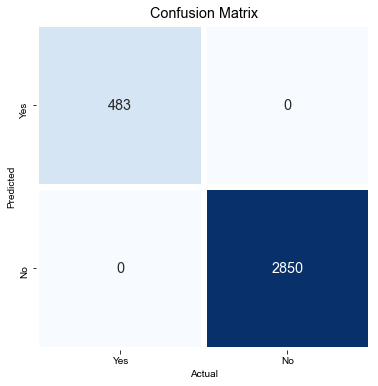

In [232]:
# Plotando a Confusion Matrix dos dados de teste em um gráfico.
plotConfusionMatrix (
    data   = cmTreino.drop(labels= 'classError', axis = 1), 
    labels = labels
)

In [233]:
# Calculando os scores de diferentes métricas, com base nas previsões geradas pelo modelo, para os dados de teste.
getClassificationMetrics(yTrue = trainTargetLabels, predProb = predTrainProb)

,Metrics
Accuracy,1
95% CI for Accuracy,"(1.0, 1.0)"
Kappa,1
Recall (Sensitivity),1
Specificity,1
Pos Pred Value,1
Neg Pred Value,1
Precision,1
Avarage Precision,1
Prevalence,0.144914


#### <font color='DarkBlue'>8.3.4.2 - Dados de teste:</font>

In [234]:
# Criando uma Confusion Matrix para avaliar as previsões feitas para os dados de treino.
cmTeste = confusionMatrix(yTrue = testTargetLabels, yPred = testPredLabels)

# Exibindo a Confusion Matrix.
cmTeste

Actual,Yes,No,classError
Predicted,,,
Yes,161,9,0.052941
No,63,1434,0.042084


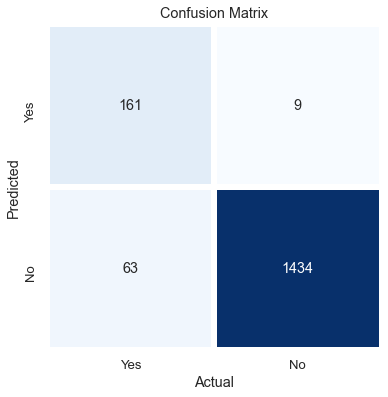

In [235]:
# Plotando a Confusion Matrix dos dados de teste em um gráfico.
plotConfusionMatrix (
    data   = cmTeste.drop(labels= 'classError', axis = 1), 
    labels = labels
)

In [236]:
# Calculando os scores de diferentes métricas, com base nas previsões geradas pelo modelo, para os dados de teste.
getClassificationMetrics(yTrue = testTargetLabels, predProb = predTestProb)

,Metrics
Accuracy,0.956809
95% CI for Accuracy,"(0.9470497743210643, 0.9665675022236268)"
Kappa,0.793289
Recall (Sensitivity),0.71875
Specificity,0.993763
Pos Pred Value,0.947059
Neg Pred Value,0.957916
Precision,0.947059
Avarage Precision,0.718491
Prevalence,0.134373


<font color='DarkBlue'> O Algortimo <b>XGBoost</b> com os dados normalizados pelo método <b>MinMaxScaler</b> foi o modelo que gerou a melhor acurácia:<br><br>
    <li><b>Dados de treino</b>: 1.0000<br>
    <li><b>Dados de teste</b>: 0.9568<br>

# <font color='DarkBlue'>9 - Otimização do modelo:</font>

## <font color='DarkBlue'>9.1 - Otimização de hyperparâmetros:</font>
<font color='DarkBlue'>Todos os algoritmos de Machine Learning são parametrizados, o que significa que é possível ajustar a performance do seu modelo preditivo, através do tuning (ajuste fino) dos parâmetros. O objetivo é encontrar a melhor combinação entre os parâmetros em cada algoritmo de Machine Learning. Esse processo também é chamado de <b>Otimização de Hyperparâmetros</b>. O scikit-learn oferece dois métodos para otimização automática dos parâmetros: <b>Grid Search Parameter Tuning</b> e <b>Random Search Parameter Tuning.</b>
<br><br>   
       
Será ajustado os parâmetros dos algoritmos a seguir:
<li><b>XGBoost</b>: algoritmo que apresentou melhor performance;
<li><b>RandomForest</b>: algoritmo que apresentou uma boa performance;
<li><b>Logistic Regression</b>: algoritmo que costuma apresentar excelente performance com parâmetros ajustados corretamente;
<br><br>
    
O dataset normalizado com o método de <b>MinMaxScaler</b> foi oque apresentou o melhor resultado, portanto, será utilizado ele para verificar a performance da melhor configuração de parâmetros.

In [237]:
# Definindo os valores do seed:
seed = 5
iterations = 15

### <font color='DarkBlue'>9.1.1 - Método Grid Search Parameter Tuning:</font>
<font color='DarkBlue'>Este método realiza metodicamente combinações entre todos os parâmetros do algoritmo, criando um grid.

#### <font color='DarkBlue'>9.1.1.1 - Algoritmo Logistic Regression:</font>

In [238]:
# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado:
paramGrid = dict (
    penalty      = ["l2",'l1'],
    C            = [0.001, 0.01, 0.05, 0.1, 0.15, 1, 10, 100],
    random_state = [0],
    tol          = [0.0001, 0.0005],
    max_iter     = [13, 15, 30, 50, 100]
)

# Criando uma instância da classe do modelo:
model = LogisticRegression()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo:
grid = GridSearchCV(estimator = model, param_grid = paramGrid, cv = 10, verbose = True, n_jobs = -1)

# Buscando pelos melhores parâmetros para o modelo:
grid.fit(trainFeatures_MM, YTreino)

# Exibindo a configuração dos melhores parâmetros:
print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", grid.best_estimator_)

Fitting 10 folds for each of 160 candidates, totalling 1600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    2.6s



Melhores Parâmetros para o Modelo:

 LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=30, multi_class='warn',
          n_jobs=None, penalty='l1', random_state=0, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)


[Parallel(n_jobs=-1)]: Done 1600 out of 1600 | elapsed:   11.2s finished


In [239]:
# Exibindo a acurácia:
print("Acurácia: %.3f" % (grid.best_score_ * 100))

Acurácia: 86.259


In [240]:
# Criando o modelo, com a melhor configuração encontrada.
classifierLR = LogisticRegression (
                    penalty      = 'l1',
                    C            = 1, 
                    solver       = 'warn',
                    random_state = 0,
                    tol          = 0.0001,
                    max_iter     = 30,
                    )

# Treinando o modelo com os dados de treino.
classifierLR.fit(X = trainFeatures_MM, y = YTreino)

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=30, multi_class='warn',
          n_jobs=None, penalty='l1', random_state=0, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [241]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainLR = accuracy_score(YTreino, classifierLR.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainLR))

Acurácia para os dados de treino: 0.8622862286228623


In [242]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestLR = accuracy_score(YTeste, classifierLR.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestLR))

Acurácia  para os dados de teste: 0.8734253149370126


#### <font color='DarkBlue'>9.1.1.2 - Algoritmo Random Forest:</font>

In [243]:
# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado:
paramGrid = dict (
    n_estimators      = [100, 105, 110, 115,120, 130], 
    max_depth         = [None, 2, 4, 6, 8],
    max_features      = ['auto', 'sqrt', 'log2'], 
    min_samples_split = [2, 5, 7, 9],
    min_samples_leaf  = [1, 2, 5]
)

# Criando uma instância da classe do modelo:
model = RandomForestClassifier()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo:
grid = GridSearchCV(estimator = model, param_grid = paramGrid, cv = 10, verbose = True, n_jobs = -1)

# Buscando pelos melhores parâmetros para o modelo:
grid.fit(trainFeatures_MM, YTreino)

# Exibindo a configuração dos melhores parâmetros:
print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", grid.best_estimator_)

Fitting 10 folds for each of 1080 candidates, totalling 10800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 438 tasks      | elapsed:   52.3s
[Parallel(n_jobs=-1)]: Done 788 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1238 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 1788 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 2438 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 3188 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 4038 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 4988 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 6038 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 7188 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 8438 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 9788 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 10800 out of 10800


Melhores Parâmetros para o Modelo:

 RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=105, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)


In [244]:
# Exibindo a acurácia:
print("Acurácia: %.3f" % (grid.best_score_ * 100))

Acurácia: 94.839


In [245]:
# Criando o modelo, com a melhor configuração encontrada.
classifierRF = RandomForestClassifier (
                        n_estimators      = 130, 
                        max_depth         = None,
                        max_features      = 'auto', 
                        min_samples_split = 2,
                        min_samples_leaf  = 1
                        )

# Treinando o modelo com os dados de treino.
classifierRF.fit(X = trainFeatures_MM, y = YTreino)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=130, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [246]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainRF = accuracy_score(YTreino, classifierRF.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainRF))

Acurácia para os dados de treino: 1.0


In [247]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestRF = accuracy_score(YTeste, classifierRF.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestRF))

Acurácia  para os dados de teste: 0.9520095980803839


#### <font color='DarkBlue'>9.1.1.3 - Algoritmo XGBoost:</font>

In [248]:
# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado:
paramGrid = dict (
    missing          = [np.nan],
    booster          = ['gbtree'],#, 'gblinear', 'dart'],
    max_depth        = [4, 5], 
    n_estimators     = [300, 350], 
    learning_rate    = [0.025, 0.03], 
    nthread          = [4], 
    subsample        = [0.95, 1], 
    colsample_bytree = [0.95, 1], 
    seed             = [100]
)

# Criando uma instância da classe do modelo:
model = xgb.XGBClassifier(eval_metric='mlogloss')

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo:
grid = GridSearchCV(estimator = model, param_grid = paramGrid, cv = 10, verbose = True, n_jobs = -1)

# Buscando pelos melhores parâmetros para o modelo:
grid.fit(trainFeatures_MM, YTreino)

# Exibindo a configuração dos melhores parâmetros:
print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", grid.best_estimator_)

Fitting 10 folds for each of 32 candidates, totalling 320 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 320 out of 320 | elapsed:  2.0min finished



Melhores Parâmetros para o Modelo:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)


In [249]:
# Exibindo a acurácia:
print("Acurácia: %.3f" % (grid.best_score_ * 100))

Acurácia: 95.950


In [250]:
# Criando o modelo, com a melhor configuração encontrada.
classifierXGB = xgb.XGBClassifier(
                        missing          = np.nan,
                        booster          = 'gbtree',
                        max_depth        = 5, 
                        n_estimators     = 300, 
                        learning_rate    = 0.025, 
                        nthread          = 4, 
                        subsample        = 0.95, 
                        colsample_bytree = 1, 
                        seed             = 100,
                        eval_metric='mlogloss'
                        )

# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = trainFeatures_MM, y = YTreino)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [251]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino, classifierXGB.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.9792979297929792


In [253]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste, classifierXGB.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.9598080383923215


### <font color='DarkBlue'>9.1.2 - Método Random Search Parameter Tuning:</font>
<font color='DarkBlue'>Este método gera amostras dos parâmetros dos algoritmos a partir de uma distribuição randômica uniforme para um número fixo de iterações. Um modelo é construído e testado para cada combinação de parâmetros.

#### <font color='DarkBlue'>9.1.2.1 - Algoritmo Logistic Regression:</font>

In [254]:
# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado:
paramGrid = dict (
    penalty      = ["l2"],
    C            = [0.001, 0.01, 0.05, 0.1, 0.15, 1, 10, 100],
    solver       = ["liblinear", "sag", "saga"],
    random_state = [0],
    tol          = [0.0001, 0.0005],
    max_iter     = [13, 15, 30, 50, 100]
)

# Criando uma instância da classe do modelo:
model = LogisticRegression()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo:
rsearch  = RandomizedSearchCV(estimator = model,
                              param_distributions = paramGrid,
                              n_iter = iterations,
                              random_state = seed)

# Buscando pelos melhores parâmetros para o modelo:
rsearch.fit(trainFeatures_MM, YTreino)

# Exibindo a configuração dos melhores parâmetros:
print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", rsearch.best_estimator_)


Melhores Parâmetros para o Modelo:

 LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=13, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=0, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)


In [255]:
# Exibindo a acurácia:
print("Acurácia: %.3f" % (rsearch.best_score_ * 100))

Acurácia: 86.289


In [256]:
# Criando o modelo, com a melhor configuração encontrada.
classifierLR = LogisticRegression (
                    penalty      = 'l2',
                    C            = 10, 
                    solver       = 'liblinear',
                    random_state = 0,
                    tol          = 0.0001,
                    max_iter     = 13,
                    )

# Treinando o modelo com os dados de treino.
classifierLR.fit(X = trainFeatures_MM, y = YTreino)

LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=13, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=0, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [257]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainLR = accuracy_score(YTreino, classifierLR.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainLR))

Acurácia para os dados de treino: 0.8625862586258626


In [258]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestLR = accuracy_score(YTeste, classifierLR.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestLR))

Acurácia  para os dados de teste: 0.8722255548890222


#### <font color='DarkBlue'>9.1.2.2 - Algoritmo Random Forest:</font>

In [259]:
# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado:
paramGrid = dict (
    n_estimators      = [100, 105, 110, 115,120, 130], 
    max_depth         = [None, 2, 4, 6, 8],
    max_features      = ['auto', 'sqrt', 'log2'], 
    min_samples_split = [2, 5, 7, 9],
    min_samples_leaf  = [1, 2, 5]
)

# Criando uma instância da classe do modelo:
model = RandomForestClassifier()

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo:
rsearch  = RandomizedSearchCV(estimator = model,
                              param_distributions = paramGrid,
                              n_iter = iterations,
                              random_state = seed)

# Buscando pelos melhores parâmetros para o modelo:
rsearch.fit(trainFeatures_MM, YTreino)

# Exibindo a configuração dos melhores parâmetros:
print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", rsearch.best_estimator_)


Melhores Parâmetros para o Modelo:

 RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=9,
            min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)


In [260]:
# Exibindo a acurácia:
print("Acurácia: %.3f" % (rsearch.best_score_ * 100))

Acurácia: 93.699


In [261]:
# Criando o modelo, com a melhor configuração encontrada.
classifierRF = RandomForestClassifier (
                        n_estimators      = 120, 
                        max_depth         = 8,
                        max_features      = 'sqrt', 
                        min_samples_split = 9,
                        min_samples_leaf  = 1
                        )

# Treinando o modelo com os dados de treino.
classifierRF.fit(X = trainFeatures_MM, y = YTreino)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=9,
            min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [262]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainRF = accuracy_score(YTreino, classifierRF.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainRF))

Acurácia para os dados de treino: 0.9600960096009601


In [263]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestRF = accuracy_score(YTeste, classifierRF.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestRF))

Acurácia  para os dados de teste: 0.9424115176964607


#### <font color='DarkBlue'>9.1.2.3 - Algoritmo XGBoost:</font>

In [264]:
# Definindo os valores que devem ser testados, em cada um dos parâmetros do modelo especificado:
paramGrid = dict (
    missing          = [np.nan],
    booster          = ['gbtree'],#, 'gblinear', 'dart'],
    max_depth        = [4, 5], 
    n_estimators     = [300, 350], 
    learning_rate    = [0.025, 0.03], 
    nthread          = [4], 
    subsample        = [0.95, 1], 
    colsample_bytree = [0.95, 1], 
    seed             = [100]
)

# Criando uma instância da classe do modelo:
model = xgb.XGBClassifier(eval_metric='mlogloss')

# Criando o grid, para fazer a busca dos melhores parâmetros para o modelo:
rsearch  = RandomizedSearchCV(estimator = model,
                              param_distributions = paramGrid,
                              n_iter = iterations,
                              random_state = seed)

# Buscando pelos melhores parâmetros para o modelo:
rsearch.fit(trainFeatures_MM, Y_MM)

# Exibindo a configuração dos melhores parâmetros:
print("\n" + "Melhores Parâmetros para o Modelo:" + "\n\n", rsearch.best_estimator_)


Melhores Parâmetros para o Modelo:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.95, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=4, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=350, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)


In [265]:
# Exibindo a acurácia:
print("Acurácia: %.3f" % (rsearch.best_score_ * 100))

Acurácia: 95.470


In [266]:
# Criando o modelo, com a melhor configuração encontrada.
classifierXGB = xgb.XGBClassifier(
                        missing          = np.nan,
                        booster          = 'gbtree',
                        max_depth        = 4, 
                        n_estimators     = 350, 
                        learning_rate    = 0.025, 
                        nthread          = 4, 
                        subsample        = 0.95, 
                        colsample_bytree = 0.95, 
                        seed             = 100,
                        eval_metric='mlogloss'
                        )

# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = trainFeatures_MM, y = YTreino)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.95, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=4, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=350, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [267]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino, classifierXGB.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.976897689768977


In [268]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste, classifierXGB.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.9574085182963408


## <font color='DarkBlue'>9.2 - Salvando o modelo:</font>

<font color='DarkBlue'>A melhor acuracia para os dados de teste foi com o algoritmo <b>XGBoost</b> com os parâmetros configurados através do método <b>Grid Search Parameter Tuning:</b><br>
<li><b>Dados de treino</b>: 0.9793<br>
<li><b>Dados de teste</b>: 0.9598<br>
<br><br>
As configurações desse modelo serão salvas em um arquivo .sav

In [270]:
# Criando o modelo, com a melhor configuração encontrada.
classifierXGB = xgb.XGBClassifier(
                        missing          = np.nan,
                        booster          = 'gbtree',
                        max_depth        = 5, 
                        n_estimators     = 300, 
                        learning_rate    = 0.025, 
                        nthread          = 4, 
                        subsample        = 0.95, 
                        colsample_bytree = 1, 
                        seed             = 100,
                        eval_metric='mlogloss'
                        )

# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = trainFeatures_MM, y = YTreino)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [271]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino, classifierXGB.predict(trainFeatures_MM))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.9792979297929792


In [272]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste, classifierXGB.predict(testFeatures_MM))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.9598080383923215


In [273]:
# Salvando o modelo
arquivo = 'modelos/modelo_classificador_final_v1.sav'
pickle.dump(classifierXGB, open(arquivo, 'wb'))
print("Modelo salvo!")

Modelo salvo!


<font color='DarkBlue'>Caso deseje pular as etapas anteriores de treinamento, execute o comando a seguir, para carregar o modelo já treinado:

In [274]:
# Carregando o arquivo
modelo_classificador_final = pickle.load(open(arquivo, 'rb'))
modelo_prod = modelo_classificador_final.score(testFeatures_MM, YTeste)
print("Modelo carregado!")

Modelo carregado!


In [275]:
# Print do resultado
print("Acurácia: %.3f" % (modelo_prod.mean() * 100))

Acurácia: 95.981


## <font color='DarkBlue'>9.3 - Redução do número de váriaveis:</font>
<font color='DarkBlue'>Será verificado a performance do modelo selecionando apenas algumas variáveis do conjunto de dados, seguindo o critério de seleção de variáveis apresentado no tópico 7 e as variáveos de maior correlação com a variável target.
    
<font color='DarkBlue'> Será usado o algortimo <b>XGBoost</b> com a <b>configuração encontrada pelo método Grid Search Parameter Tuning</b> e os dados normalizados pelo método <b>MinMaxScaler</b>, que foi a configuração que gerou a melhor acurácia.

### <font color='DarkBlue'>9.3.1 - Selecionando as variáveis de maior correlação com a variável target:</font>

In [276]:
# Dados de treino:

# Selecionando as 4 variáveis mais correlacionadas com a variável target:
colunas_corr = ['international_plan', 'number_customer_service_calls', 'total_day_minutes', 'voice_mail_plan']

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
XTreino_corr = trainFeatures_MM[colunas_corr]
YTreino_corr = YTreino.copy()

In [277]:
# Dados de teste:

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
XTeste_corr = testFeatures_MM[colunas_corr]
YTeste_corr = YTeste.copy()

In [278]:
# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = XTreino_corr, y = YTreino_corr)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [279]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino_corr, classifierXGB.predict(XTreino_corr))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.9234923492349235


In [280]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste_corr, classifierXGB.predict(XTeste_corr))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.901619676064787


### <font color='DarkBlue'>9.3.2 - Selecionando as variáveis pelo método RFE:</font>

In [281]:
# Dados de treino:

# Selecionando as 6 variáveis mais correlacionadas com a variável target:
colunas_RFE = ['international_plan', 'voice_mail_plan', 'total_day_minutes', 'total_intl_minutes', 'total_intl_calls'
              , 'number_customer_service_calls']

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
XTreino_RFE = trainFeatures_MM[colunas_RFE]
YTreino_RFE = YTreino.copy()

In [282]:
# Dados de teste:

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
XTeste_RFE = testFeatures_MM[colunas_RFE]
YTeste_RFE = YTeste.copy()

In [283]:
# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = XTreino_RFE, y = YTreino_RFE)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [284]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino_RFE, classifierXGB.predict(XTreino_RFE))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.9522952295229523


In [285]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste_RFE, classifierXGB.predict(XTeste_RFE))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.9280143971205759


### <font color='DarkBlue'>9.3.3 - Selecionando as variáveis pelo método ExtraTreesClassifier:</font>

In [286]:
# Dados de treino:

# Selecionando as 6 variáveis mais correlacionadas com a variável target:
colunas_ETC = ['total_day_minutes', 'number_customer_service_calls', 'total_eve_minutes', 'international_plan', 
               'total_intl_minutes', 'total_intl_calls']

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
XTreino_ETC = trainFeatures_MM[colunas_ETC]
YTreino_ETC = Y.copy()

In [287]:
# Dados de teste:

# Separando o array em componentes de input (X - Variáveis) e output (Y - target):
XTeste_ETC = testFeatures_MM[colunas_ETC]
YTeste_ETC = YTeste.copy()

In [288]:
# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = XTreino_ETC, y = YTreino_ETC)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [289]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino_ETC, classifierXGB.predict(XTreino_ETC))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.963096309630963


In [290]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste_ETC, classifierXGB.predict(XTeste_ETC))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.9358128374325135


### <font color='DarkBlue'>9.3.4 - Avaliando a performance pelo método PCA:</font>

In [291]:
# Treinando o modelo com os dados de treino.
classifierXGB.fit(X = trainFeatures_PCA, y = YTreino)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
       gamma=0, gpu_id=-1, importance_type='gain',
       interaction_constraints='', learning_rate=0.025, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=nan,
       monotone_constraints='()', n_estimators=300, n_jobs=4, nthread=4,
       num_parallel_tree=1, objective='binary:logistic', random_state=100,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=100,
       subsample=0.95, tree_method='exact', use_label_encoder=True,
       validate_parameters=1, verbosity=None)

In [292]:
# Calculando a acurácia do modelo para o conjunto de dados de treino.
scoreTrainXGB = accuracy_score(YTreino, classifierXGB.predict(trainFeatures_PCA))

# Visualizando o resultado.
print('Acurácia para os dados de treino: ' + str(scoreTrainXGB))

Acurácia para os dados de treino: 0.8868886888688869


In [293]:
# Calculando a acurácia do modelo para o conjunto de dados de teste.
scoreTestXGB = accuracy_score(YTeste, classifierXGB.predict(testFeatures_PCA))

# Visualizando o resultado.
print('Acurácia  para os dados de teste: ' + str(scoreTestXGB))

Acurácia  para os dados de teste: 0.8638272345530894


<font color='DarkBlue'>Não houve uma melhora na acurácia dos dados reduzindo o numero de variáveis.

# <font color='DarkBlue'>10 - Resultado final:</font>

## <font color='DarkBlue'>10.1 - Reavalizando as métricas para os dados de treino e teste:</font>

<font color='DarkBlue'> Será usado o algortimo <b>XGBoost</b> com a <b>configuração encontrada pelo método Grid Search Parameter Tuning</b> e os dados normalizados pelo método <b>MinMaxScaler</b>, que foi a configuração que gerou a melhor acurácia.

<font color='DarkBlue'>
<li><b>Accuracy</b>: Determina a precisão geral prevista do modelo;<br>
<li><b>95% CI for Accuracy</b>: Determina um intervalo de confiança de 95% para a acurácia;<br>
<li><b>Kappa</b>: Determina o coeficiente de Kappa;<br>
<li><b>Recall (Sensitivity)</b>: Determina a proporção de registros positivos que foram classificados pelo algoritmo  como positivos;<br>
<li><b>Specificity</b>: Determina a proporção de registros negativos que foram classificados pelo algoritmo como negativos;<br>
<li><b>Pos Pred Value</b>: Determina a porcentagem de positivos previstos que são realmente positivos;<br>
<li><b>Neg Pred Value</b>: Determina a porcentagem de negativos previstos que são realmente negativos;<br>
<li><b>Precision</b>: Determina a proporção de classificações positivas, que realmente são positivas;<br>
<li><b>Avarage Precision</b>: Determina a precisão como a média ponderada de precisões alcançadas em cada limite;<br>
<li><b>Prevalence</b>: Determina a frequência com que a classe positiva realmente ocorre em nossa amostra;<br>
<li><b>Detection Rate</b>: Determina a proporção de classificações positivas feitas corretamente em relação a todas as previsões feitas;<br>
<li><b>Detection Prevalence</b>: Determina a precisão geral prevista do modelo;<br>    
<li><b>F1</b>: Determina a média Harmônica entre a precision e o recall do modelo;<br>
<li><b>ROC AUC</b>: Determina a medida de separabilidade ROC. Ela indica o quanto o modelo é capaz de distinguir  as classes;<br>
<li><b>Error</b>: Determina o erro do modelo em relação a sua acurácia;<br>
<li><b>95% CI for Error</b>: Determina um intervalo de confiança de 95% para o erro;<br>
<li><b>Balanced Accuracy</b>: Determina a acurácia do modelo balanceada pelos tamanhos das classes;<br>
<li><b>Positive Class</b>: Define qual classe é a classe positiva.

In [294]:
# Carregando o modelo já configurado:
modelo_classificador_final = pickle.load(open(arquivo, 'rb'))

In [295]:
# Realizando as predições das probabilidades, dos dados de treino e teste, para o modelo selecionado.
predTrainProb = modelo_classificador_final.predict_proba(trainFeatures_MM)[:,1]
predTestProb  = modelo_classificador_final.predict_proba(testFeatures_MM)[:,1]

In [296]:
# Definindo as classes positiva e negativa da variável target.
labelPositive = 'Yes'
labelNegative = 'No'

# Criando uma lista com as categorias das classes.
labels = [labelPositive, labelNegative]

# Convertendo dados da variável target, dos dados de treino, para utilizar as labels especificadas.
trainTargetLabels = [labelPositive if t == 1 else labelNegative for t in YTreino]
trainPredLabels   = [labelPositive if t >= 0.5 else labelNegative for t in predTrainProb]

# Convertendo dados da variável target, dos dados de teste, para utilizar as labels especificadas.
testTargetLabels = [labelPositive if t == 1 else labelNegative for t in YTeste]
testPredLabels   = [labelPositive if t >= 0.5 else labelNegative for t in predTestProb]

#### <font color='DarkBlue'>8.3.4.1 - Dados de treino:</font>

In [297]:
# Criando uma Confusion Matrix para avaliar as previsões feitas para os dados de treino.
cmTreino = confusionMatrix(yTrue = trainTargetLabels, yPred = trainPredLabels)

# Exibindo a Confusion Matrix.
cmTreino

Actual,Yes,No,classError
Predicted,,,
Yes,414,0,0.000000
No,69,2850,0.023638


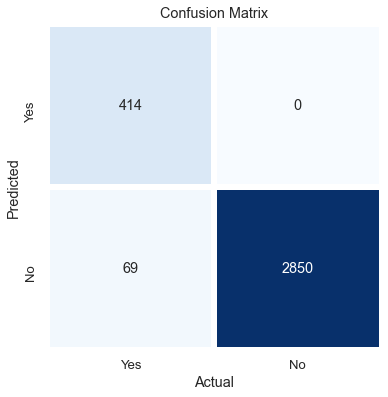

In [298]:
# Plotando a Confusion Matrix dos dados de teste em um gráfico.
plotConfusionMatrix (
    data   = cmTreino.drop(labels= 'classError', axis = 1), 
    labels = labels
)

In [299]:
# Calculando os scores de diferentes métricas, com base nas previsões geradas pelo modelo, para os dados de teste.
getClassificationMetrics(yTrue = trainTargetLabels, predProb = predTrainProb)

,Metrics
Accuracy,0.979298
95% CI for Accuracy,"(0.9744639734784989, 0.9841318861074596)"
Kappa,0.911198
Recall (Sensitivity),0.857143
Specificity,1
Pos Pred Value,1
Neg Pred Value,0.976362
Precision,1
Avarage Precision,0.877845
Prevalence,0.144914


#### <font color='DarkBlue'>8.3.4.2 - Dados de teste:</font>

In [300]:
# Criando uma Confusion Matrix para avaliar as previsões feitas para os dados de treino.
cmTeste = confusionMatrix(yTrue = testTargetLabels, yPred = testPredLabels)

# Exibindo a Confusion Matrix.
cmTeste

Actual,Yes,No,classError
Predicted,,,
Yes,164,7,0.040936
No,60,1436,0.040107


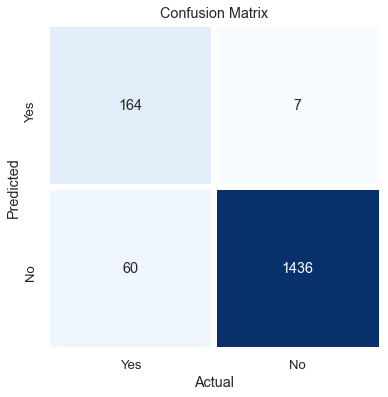

In [301]:
# Plotando a Confusion Matrix dos dados de teste em um gráfico.
plotConfusionMatrix (
    data   = cmTeste.drop(labels= 'classError', axis = 1), 
    labels = labels
)

In [302]:
# Calculando os scores de diferentes métricas, com base nas previsões geradas pelo modelo, para os dados de teste.
getClassificationMetrics(yTrue = testTargetLabels, predProb = predTestProb)

,Metrics
Accuracy,0.959808
95% CI for Accuracy,"(0.9503793764590556, 0.9692367003255875)"
Kappa,0.808047
Recall (Sensitivity),0.732143
Specificity,0.995149
Pos Pred Value,0.959064
Neg Pred Value,0.959893
Precision,0.959064
Avarage Precision,0.738165
Prevalence,0.134373


<font color='DarkBlue'> O <b>algortimo XGBoost</b> com a <b>configuração encontrada pelo método Grid Search Parameter Tuning</b> e os dados <b>normalizados pelo método MinMaxScaler</b>, que foi a configuração que gerou a melhor acurácia:<br><br>
<li><b>Dados de treino</b>: 0.979298<br>
<li><b>Dados de teste</b>: 0.959808<br>

<h1 style="font-size:25px; color:DarkBlue;"><i><center>Caso tenha alguma dúvida, sugestão ou apenas queira trocar uma ideia sobre este projeto, não hesite em entrar em contato comigo!</center></i></h1><br>

### <font color='DarkBlue'>WhatsApp: (11) 973763378
    
    
### <font color='DarkBlue'>Linkedin: <a href="https://www.linkedin.com/in/paulo-henrique-piai-7b179411a/"> Paulo Henrique Piai</a>
    
    
### <font color='DarkBlue'>Github: <a href="https://github.com/paulopiai"> paulopiai</a>

<h1 style="font-size:50px; color:DarkBlue;"><i><center>Obrigado!</center></i></h1>